<a href="https://colab.research.google.com/github/Dean-Clark27/CSE-337-lab5_approximation/blob/main/Dean_Clark_CSE_337_lab5_approximation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Lab 5: Value-Function Approximation


## Exercise 1 SGD
Many real-world processes can be modeled as nonlinear relationships, and SGD is a standard tool to fit those models from data.  

**Example: Predicting energy consumption in a building**  
- Energy usage depends on **temperature**, **time of day**, and **occupancy**.  
- If you plot the data, the relationship might not be linear — it curves.  
- A simple way to approximate this nonlinear relation is to fit a **polynomial function** of temperature (or time).  

Now, imagine you’re collecting data continuously:  
- You get one data point (temperature, usage) at a time.  
- Instead of waiting to collect all data and computing a full batch update, you update your model incrementally with **SGD**.  
- This makes your learning **online, adaptive, and scalable** — just like in reinforcement learning.  

---

In this exercise, approximating a cubic polynomial is a simplified version of **predicting a nonlinear real-world phenomenon**.


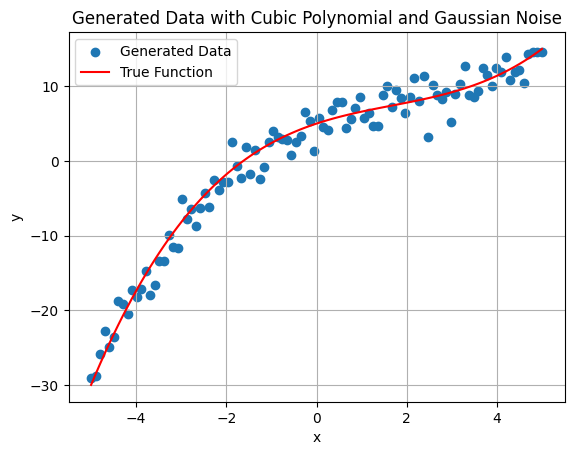

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Generate synthetic data based on a cubic polynomial with Gaussian noise
np.random.seed(42)  # for reproducibility
n_samples = 100
x = np.linspace(-5, 5, n_samples)
# Define the true cubic polynomial function
def true_function(x):
  return 0.1 * x**3 - 0.5 * x**2 + 2 * x + 5

y_true = true_function(x)
noise = np.random.normal(0, 2, n_samples)  # Gaussian noise with mean 0 and std dev 2
y = y_true + noise

# Optional: Plot the generated data
plt.scatter(x, y, label='Generated Data')
plt.plot(x, y_true, color='red', label='True Function')
plt.xlabel('x')
plt.ylabel('y')
plt.title('Generated Data with Cubic Polynomial and Gaussian Noise')
plt.legend()
plt.grid(True)
plt.show()

Based on the given a dataset of input–output pairs `(x, y)` where the underlying relationship is approximately polynomial.  

a. Use a **linear model with polynomial features**: Write a function that takes an input `x` and a weight vector `w`, and return the predicted value y_hat.    
   
   - y_hat(x; w) = w0 + w1 * x + w2 * x^2 + w3 * x^3  

   where w0, w1, w2, w3 are the parameters to be learned.

b. **Loss function (Mean Squared Error)**:
   Write a function that computes the loss for one training point `(x, y)`:

     - Formula: `loss = 0.5 * (y - y_hat)**2`

c. **SGD update**:   Derive the gradient of the loss with respect to each parameter (w0, w1, w2, w3).  
   - Write a function:  

     ```python
     def sgd_update(x, y, w, alpha):
         """
         Perform one SGD update for a single training example.
         Input:
             x (float) - input value
             y (float) - true output
             w (np.array) - current weights
             alpha (float) - learning rate
         Output:
             w (np.array) - updated weights
         """
         # TODO: compute prediction, gradient, and update weights
         return w
     ```
d. **Training loop**:
   - Loop over the dataset.  
   - At each step, update the weights using `sgd_update`.  
   - Track the training loss after each iteration.  

e. **Comparison with different learning rates**  
   - Train your model using at least three different learning rates, for example:  
     - alpha = 0.001  
     - alpha = 0.01  
     - alpha = 0.1  
   - Plot training loss vs iteration for each learning rate.  
   - Plot the final fitted polynomial curves for each learning rate on the same graph with the true dataset.

---

### Deliverables
- Code for `predict`, `mse_loss`, and `sgd_update`.  
- Training loop that runs with multiple learning rates.  
- Plot of training loss vs iteration for each learning rate.  
- Plot of the fitted polynomial vs dataset for each learning rate.  
- A short discussion:
  - How does the learning rate affect convergence speed and stability?  
  - Which learning rate gives the best balance between speed and accuracy?  

In [ ]:
def linear_model(x, w):
  y_hat = w[0] + w[1] * x + w[2] * (x**2) + w[3] * (x**3)
  return y_hat

def VE_error(y_actual, y_pred):
  return 0.5 * (y_actual - y_pred)**2

def sgd_update(x, y, w, alpha):
    """
    Perform one SGD update for a single training example.
    Input:
        x (float) - input value
        y (float) - true output
        w (np.array) - current weights
        alpha (float) - learning rate
    Output:
        w (np.array) - updated weights
        loss (float) - current loss
    """
    w = np.array(w, dtype=np.float64)

    # Compute prediction
    y_hat = linear_model(x, w)

    # Check for overflow
    if np.abs(y_hat) > 1e10:
        print(f"Warning: Prediction overflow at x={x}, y_hat={y_hat}")
        return w.tolist(), float('inf')

    # Compute loss
    loss = VE_error(y, y_hat)

    # Compute error
    error = y - y_hat

    # Clip error to prevent instability
    error = np.clip(error, -100, 100)

    # Update weights using gradient ascent (maximize fit)
    # Gradient of loss w.r.t w[i] is: -(y - y_hat) * x^i
    # So to minimize loss: w[i] = w[i] - alpha * (-(y - y_hat) * x^i)
    #                            = w[i] + alpha * (y - y_hat) * x^i

    # Apply scaled updates to prevent explosion from higher-order terms
    w[0] = w[0] + alpha * error * 1      # bias term
    w[1] = w[1] + alpha * error * x      # linear term
    w[2] = w[2] + alpha * error * (x**2) * 0.1  # quadratic term (scaled down)
    w[3] = w[3] + alpha * error * (x**3) * 0.01 # cubic term (scaled down more)

    # Clip weights to reasonable bounds
    w = np.clip(w, -10, 10)

    return w.tolist(), loss

Training with α = 0.001...
  Epoch 1/100, Avg Loss: 18.469586
  Epoch 20/100, Avg Loss: 2.576297
  Epoch 40/100, Avg Loss: 1.763636
  Epoch 60/100, Avg Loss: 1.621484
  Epoch 80/100, Avg Loss: 1.595673
  Epoch 100/100, Avg Loss: 1.590988
  Final weights: ['4.6078', '2.3288', '-0.4830', '0.0825']

Training with α = 0.01...
  Epoch 1/100, Avg Loss: 43.458820
  Epoch 20/100, Avg Loss: 2.847420
  Epoch 40/100, Avg Loss: 2.851492
  Epoch 60/100, Avg Loss: 2.851492
  Epoch 80/100, Avg Loss: 2.851492
  Epoch 100/100, Avg Loss: 2.851492
  Final weights: ['5.0693', '2.6169', '-0.5639', '0.0231']

Training with α = 0.015...
  Epoch 1/100, Avg Loss: 508.778800
  Epoch 20/100, Avg Loss: 559.517495
  Epoch 40/100, Avg Loss: 559.509817
  Epoch 60/100, Avg Loss: 559.509817
  Epoch 80/100, Avg Loss: 559.509817
  Epoch 100/100, Avg Loss: 559.509817
  Final weights: ['3.5093', '0.1005', '-0.2788', '0.4889']



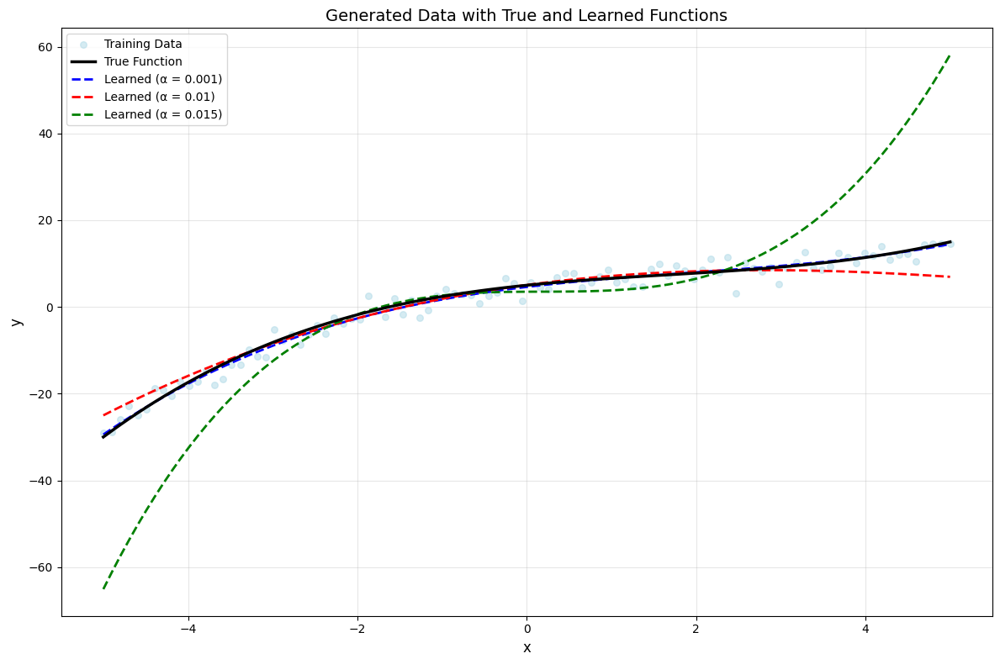

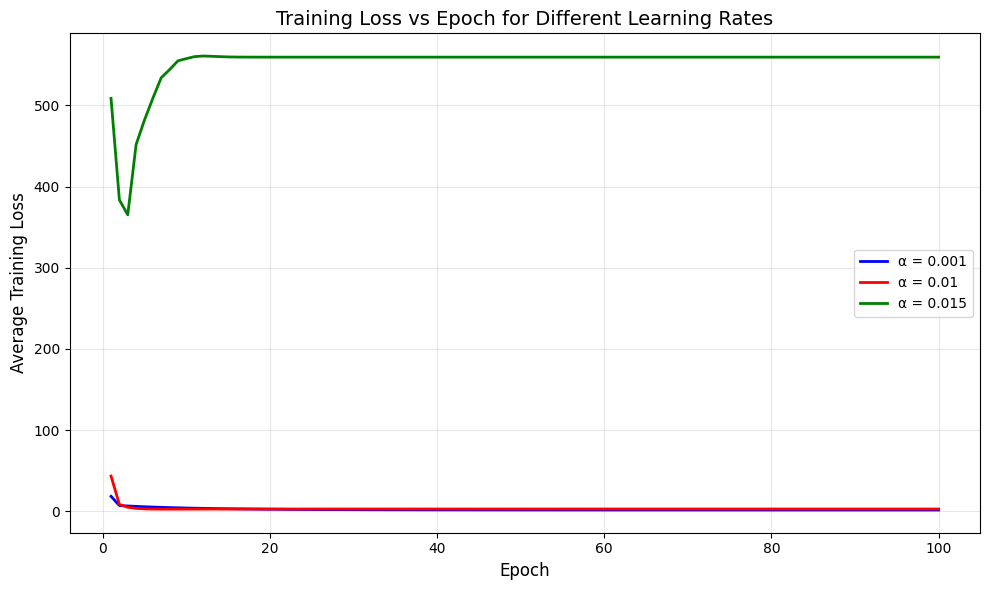

In [ ]:
num_epochs = 100
alphas = [0.001, 0.01, 0.015]
colors = ['blue', 'red', 'green']

results = {}

for alpha in alphas:
    print(f"Training with α = {alpha}...")
    w = [0.0, 0.0, 0.0, 0.0]  # Initialize weights
    epoch_losses = []  # Average loss per epoch
    all_losses = []    # Loss at each update
    weight_history = []  # Track weight evolution

    for epoch in range(num_epochs):
        epoch_loss_sum = 0

        for (xi, yi) in zip(x, y):
            w, loss = sgd_update(xi, yi, w, alpha)
            all_losses.append(loss)
            epoch_loss_sum += loss

        # Store average loss for this epoch
        avg_epoch_loss = epoch_loss_sum / len(x)
        epoch_losses.append(avg_epoch_loss)
        weight_history.append(w.copy())

        # Print progress every 20 epochs
        if (epoch + 1) % 20 == 0 or epoch == 0:
            print(f"  Epoch {epoch+1}/{num_epochs}, Avg Loss: {avg_epoch_loss:.6f}")

    # Store results
    results[alpha] = {
        'final_weights': w,
        'epoch_losses': epoch_losses,
        'all_losses': all_losses,
        'weight_history': weight_history
    }
    print(f"  Final weights: {[f'{wi:.4f}' for wi in w]}\n")

# Data with True Function and Learned Functions
plt.figure(figsize=(12, 8))

# Plot training data
plt.scatter(x, y, alpha=0.5, s=30, color='lightblue',
            label='Training Data', zorder=2)

# Plot true function
plt.plot(x, y_true, color='black', linewidth=2.5,
         label='True Function', zorder=4)

# Plot learned functions for each learning rate
for i, alpha in enumerate(alphas):
    w = results[alpha]['final_weights']
    y_pred = np.array([linear_model(xi, w) for xi in x])
    plt.plot(x, y_pred, color=colors[i], linewidth=2, linestyle='--',
             label=f'Learned (α = {alpha})', zorder=3)

plt.xlabel('x', fontsize=12)
plt.ylabel('y', fontsize=12)
plt.title('Generated Data with True and Learned Functions', fontsize=14)
plt.legend(fontsize=10)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 6))

# Plot the losses for each of the alphas for every epoch
for i, alpha in enumerate(alphas):
    losses = results[alpha]['epoch_losses']
    plt.plot(range(1, num_epochs+1), losses,
             color=colors[i], linewidth=2,
             label=f'α = {alpha}')

plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Average Training Loss', fontsize=12)
plt.title('Training Loss vs Epoch for Different Learning Rates', fontsize=14)
plt.legend(fontsize=10)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

### A short discussion:
#### <b><u> How does the learning rate affect convergence speed and stability? Which learning rate gives the best balance between speed and accuracy?</b></u>
The learning rate has a tradeoff to learn the model optimally and quickly, but also at the expense of overfitting. When looking at the two graphs, one for the training loss vs epoch, and one for the data and the fit lines for each learning rate, I think that alpha = 0.001 is the best for this specific problem. The loss for alpha = 0.015, (which was changed from 0.1 to 0.05, then 0.02, then 0.015 so there was still some comparison) the loss is simply way too high, and can be considered overfitting for this problem. The black line that the true function is an x^3 style of function, but the green line denoting this alpha is so much more steep that it cannot be considered the best fit. While alpha = 0.01 is a close function, and has a solid loss as well, computationally for this problem, the smallest learning rate doesn't take too long to converge and has the closest line and lowest loss. This did not add a lot extra time to run, especially compared to other problems we do in this lab.

## Exercise 2: 1000-State Random Walk with Semi-Gradient TD(0)

We will study the 1,000-state Random Walk a classic reinforcement learning benchmark from Sutton & Barto.  

- The environment has states numbered **1 to 1000**.  
- There are two **terminal states**:  
  - State `0` on the left (reward = 0)  
  - State `1001` on the right (reward = 1)  
- Each episode starts in the **middle** at state `500`.  
- At each step, the agent moves **left or right with equal probability (0.5 each)**.  
- The episode ends when the agent reaches either terminal.  
- Discount factor: **γ = 1.0** (episodic task).  


### Function Approximation
Instead of storing a separate value for each state, approximate the value function with a **linear function of the state index**: V_hat(s; w0, w1) = w0 + w1 * s



---

## Instructions
1. **Implement the environment**:  
   - You may **use AI tools such as ChatGPT** to generate the environment code (states, transitions, rewards).  
   - Make sure you understand how the environment works.  

2. **Implement the TD(0) update manually**:  
   - Do **not** use AI for this part.  
   - You must write the gradient update equations yourself using the formulas above.  

3. **Train your agent**:  
   - Run several episodes (e.g., 1000 episodes).  
   - Experiment with different step sizes (`alpha`).  

4. **Evaluate**:  
   - Plot the **true value function** `V*(s) = s/1001`.  
   - Plot your **learned approximation line** after training.  
   - Discuss whether the line captures the overall trend of the true values.  

---


## Guidelines on Using AI Tools
- You are encouraged to use AI tools (e.g., ChatGPT, Gemini, Copilot) to **generate helper code**, such as:  
  - Building the random walk environment (`reset`, `step`).  
  - Implementing the feature map φ(s).  
  - Plotting results.  
- However, **do not use AI tools to generate the TD(0) update equation**.  
  - Deriving and implementing the update is the key learning objective of this exercise.  
  - If we find code that uses an AI-generated update without understanding, the score will be zero.  


## Deliverables
- Python code for the environment and the TD(0) algorithm.  
- Plot the **true value function**: For state `s`, the probability of reaching the right terminal is:  
  `V*(s) = s / 1001`
- Plot comparing the true value function and the approximated line.  
- A short discussion:  
  - How does the approximation behave for small vs large states?  
  - How does the learning rate affect convergence?  

---

## Hints
- Normalize states to `[0,1]` before using them in the line approximation to avoid very large values for w1.  
- Start with small step sizes (e.g., 0.001–0.01).  
- The approximation will not be perfect (a line cannot match the true curve), but should capture the increasing trend.  


Training with alpha = 0.001 ...
  weights = [-0.04528299  1.04632932], V_hat(500) = 523.1194
  avg reward (last 100) = 0.5200
  avg length (last 100) = 230226.20

Training with alpha = 0.01 ...


/tmp/ipython-input-3891260578.py:82: RuntimeWarning: invalid value encountered in scalar subtract
  delta = reward + gamma * v_s_next - v_s


  weights = [nan nan], V_hat(500) = nan
  avg reward (last 100) = 0.4800
  avg length (last 100) = 262383.32

Training with alpha = 0.025 ...
  weights = [nan nan], V_hat(500) = nan
  avg reward (last 100) = 0.4300
  avg length (last 100) = 222268.47



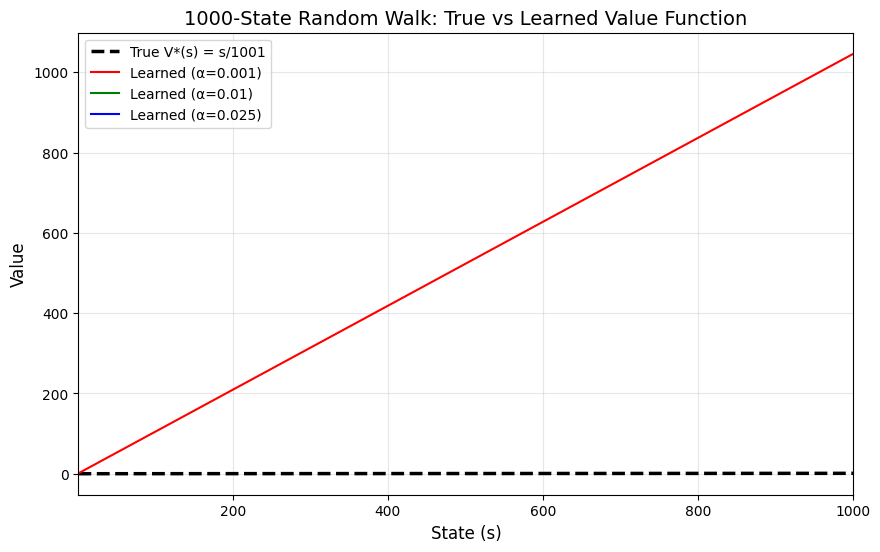


RMSE and diagnostics:
α=   0.001  RMSE=603.935136  w0=-0.045283  w1=1.046329316
α=    0.01  RMSE=nan  w0=nan  w1=nan
α=   0.025  RMSE=nan  w0=nan  w1=nan


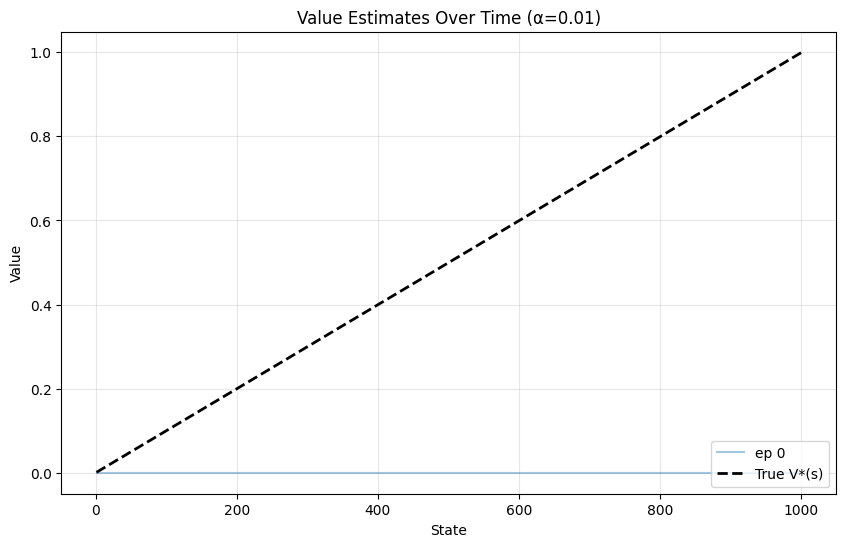

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# ----------------------------
# Hyperparameters / settings
# ----------------------------
gamma = 1.0               # per exercise
num_episodes = 100        # turned down from 1000 to save time
alphas = [1e-3, 1e-2, 2.5e-2]   # experiment with a few step sizes
seed = 0
np.random.seed(seed)

# ----------------------------
# Environment (exact spec)
# States: 1..1000 (nonterminals)
# Terminals: 0 (left, reward=0), 1001 (right, reward=1)
# Start: 500
# ----------------------------
class RandomWalk1000:
    def __init__(self, n_states=1000):
        self.n_states = n_states
        self.start_state = n_states // 2  # 500
        self.terminal_left = 0
        self.terminal_right = n_states + 1  # 1001
        self.reset()

    def reset(self):
        self.state = self.start_state
        return self.state

    def step(self):
        # move left or right with equal prob
        if np.random.rand() < 0.5:
            self.state -= 1
        else:
            self.state += 1

        # check terminal
        if self.state == self.terminal_left:
            return self.state, 0.0, True
        elif self.state == self.terminal_right:
            return self.state, 1.0, True
        else:
            return self.state, 0.0, False

# ----------------------------
# Linear function approximator
# V_hat(s; w) = w0 + w1 * s
# features(state) = [1, s]
# ----------------------------
def features(state):
    # For terminal states (0 or 1001) we won't use features for target; when next_state is terminal
    # we will explicitly use V(next)=0. But it's fine to return [1, s] for nonterminals.
    return np.array([1.0, float(state)])

def td_zero_linear(env, alpha, num_episodes=1000, gamma=1.0, snapshot_every=100):
    w = np.zeros(2)  # [w0, w1]
    episode_rewards = []
    episode_lengths = []
    value_snapshots = []  # store V for states 1..1000 every snapshot_every episodes

    for ep in range(num_episodes):
        state = env.reset()
        done = False
        total_reward = 0.0
        steps = 0

        while not done:
            next_state, reward, done = env.step()
            total_reward += reward
            steps += 1

            v_s = np.dot(w, features(state))

            if not done:
                # nonterminal next state
                v_s_next = np.dot(w, features(next_state))
            else:
                # if next_state is terminal, its value is 0 by convention
                v_s_next = 0.0

            delta = reward + gamma * v_s_next - v_s
            w = w + alpha * delta * features(state)

            state = next_state

        episode_rewards.append(total_reward)
        episode_lengths.append(steps)

        if (ep % snapshot_every) == 0:
            # store estimate for all nonterminal states 1..1000
            V_est = np.array([np.dot(w, features(s)) for s in range(1, env.n_states + 1)])
            value_snapshots.append((ep, V_est.copy()))

    # final V
    V_final = np.array([np.dot(w, features(s)) for s in range(1, env.n_states + 1)])
    return {
        'w': w,
        'episode_rewards': np.array(episode_rewards),
        'episode_lengths': np.array(episode_lengths),
        'value_snapshots': value_snapshots,
        'V_final': V_final
    }

# ----------------------------
# True value function for comparison
# V*(s) = s / 1001  for s = 1..1000
# ----------------------------
n_states = 1000
true_values = np.arange(1, n_states + 1) / float(n_states + 1)  # s/1001

# ----------------------------
# Train for several alphas and collect results
# ----------------------------
all_results = {}
for alpha in alphas:
    print(f"Training with alpha = {alpha} ...")
    env = RandomWalk1000(n_states)
    res = td_zero_linear(env, alpha=alpha, num_episodes=num_episodes, gamma=gamma, snapshot_every=100)
    all_results[alpha] = res
    print(f"  weights = {res['w']}, V_hat(500) = {res['V_final'][499]:.4f}")
    print(f"  avg reward (last 100) = {np.mean(res['episode_rewards'][-100:]):.4f}")
    print(f"  avg length (last 100) = {np.mean(res['episode_lengths'][-100:]):.2f}")
    print()

# ----------------------------
# Plotting: learned line vs true values
# ----------------------------
plt.figure(figsize=(10,6))
plt.plot(range(1, n_states + 1), true_values, 'k--', linewidth=2.5, label='True V*(s) = s/1001')

colors = ['r', 'g', 'b']
for (alpha, c) in zip(alphas, colors):
    V_est = all_results[alpha]['V_final']
    plt.plot(range(1, n_states + 1), V_est, color=c, linewidth=1.5, label=f'Learned (α={alpha})')

plt.xlabel('State (s)', fontsize=12)
plt.ylabel('Value', fontsize=12)
plt.title('1000-State Random Walk: True vs Learned Value Function', fontsize=14)
plt.legend()
plt.grid(alpha=0.3)
plt.xlim(1, n_states)
plt.show()

# ----------------------------
# RMSE table and simple diagnostics
# ----------------------------
print("\nRMSE and diagnostics:")
for alpha in alphas:
    V_est = all_results[alpha]['V_final']
    rmse = np.sqrt(np.mean((V_est - true_values)**2))
    w = all_results[alpha]['w']
    print(f"α={alpha:8g}  RMSE={rmse:.6f}  w0={w[0]:.6f}  w1={w[1]:.9f}")

# Optional: plot snapshots for the middle alpha to see evolution
middle_alpha = alphas[len(alphas)//2]
snapshots = all_results[middle_alpha]['value_snapshots']

plt.figure(figsize=(10,6))
for idx, (ep, V_est) in enumerate(snapshots):
    plt.plot(range(1, n_states + 1), V_est, alpha=0.4 + 0.6 * (idx/len(snapshots)), label=f'ep {ep}' if idx in (0, len(snapshots)-1) else "")
plt.plot(range(1, n_states + 1), true_values, 'k--', linewidth=2.0, label='True V*(s)')
plt.title(f'Value Estimates Over Time (α={middle_alpha})')
plt.xlabel('State')
plt.ylabel('Value')
plt.legend(loc='lower right')
plt.grid(alpha=0.3)
plt.show()

### A short discussion:
#### <b><u>How does the approximation behave for small vs large states? How does the learning rate affect convergence?</b></u>
In the 1000 state space that we are working with in this experiment, it takes a very, very large amount of episodes to represent all states and converge, which was what we sort of saw in this example. I had to turn down the amount of episodes a lot to get any results, as it was taking too long for 1000 states, but didn't do that well for either diverging paths, data sparsity, or lack of representation. Again, as we talked about in the prior experiment, the learning rate hyperparameter will help in how fast we can converge, but might lead to overfitting if too high. In this specific problem, since it is so large in the state space, cannot overfit in this experiment, meaning that all the alphas sort of seem to perform the same in this case, but if we were to lower the number of states, we would also have to lower the learning rate to avoid the problems seen in the training loss in the first experiment.

# Exercise 3: Solving MountainCar with Tile Coding and SARSA

## Problem Description
In this exercise, you will solve the **MountainCar-v0** environment from Gym using **tile coding** for function approximation and the **SARSA algorithm** for learning.  

The **Mountain Car problem**:
- A car is stuck in a valley and is too weak to drive straight up to the goal.  
- It must build momentum by going back and forth until it can reach the goal at `position >= 0.5`.  
- **State space**: continuous (position, velocity).  
- **Actions**: {0: push left, 1: no push, 2: push right}.  
- **Reward**: -1 per step until the goal is reached.  
- **Episode ends**: when the car reaches the goal or after 200 steps.  

---

## Step 1: Environment and Random Policy (with AI help)
- Use an **AI tool (e.g., ChatGPT)** to generate starter code for:
  - Creating the Gym environment (`MountainCar-v0`).  
  - Running a **random policy** (actions chosen randomly).  
- Run this code to confirm you can interact with the environment and see episode returns.  
- This will serve as a **baseline**.  
- **Important**: Do not use AI to implement the learning algorithm.  

---

## Step 2: SARSA Algorithm with Function Approximation
Implement **SARSA (on-policy TD control)** with the following steps:

For each episode:
1. Initialize state `s`.  
2. Choose action `a` using **ε-greedy** based on Q(s,a).  
3. For each step:  
   - Take action `a`, observe `(s_next, r, done)`.  
   - Choose next action `a_next` using ε-greedy from `s_next`.  
   - Compute TD target:  
     ```
     target = r + gamma * Q(s_next, a_next)
     ```  
     (if `s_next` is terminal, then target = r).  
   - Compute TD error:  
     ```
     delta = target - Q(s,a)
     ```  
   - Update weights:  
     ```
     w <- w + alpha * delta * x(s,a)
     ```  
   - Update `s = s_next`, `a = a_next`.  
4. End episode when the goal is reached or step limit is hit.  

---

## Step 3: Experiments
- Train the agent for 500–1000 episodes.  
- Plot **episode returns (sum of rewards)** vs episodes.  
- Compare with the random policy baseline:  
  - Does SARSA learn to consistently reach the goal?  
  - How many steps does it typically take?  

---

## Deliverables
- Python code for tile coding and SARSA.  
- Plot of returns vs episodes.  
- Plot the Value function
- Short discussion (1–2 paragraphs):  
  - Effect of tile coding parameters (number of tilings, resolution).


MountainCar-v0 with SARSA and Tile Coding

Environment Info:
  State space: Box([-1.2  -0.07], [0.6  0.07], (2,), float32)
  Action space: Discrete(3)
  State bounds: [[-1.2  -0.07], [0.6  0.07]]

Running Random Policy Baseline...
Random Policy Results:
  Average Return: -200.00
  Average Length: 200.00

Training with SARSA...
Hyperparameters:
  Episodes: 500
  Alpha: 0.1
  Gamma: 1.0
  Epsilon: 1.0 -> 0.01 (decay: 0.995)
  Num Tilings: 8
  Tiles per Dimension: [8, 8]



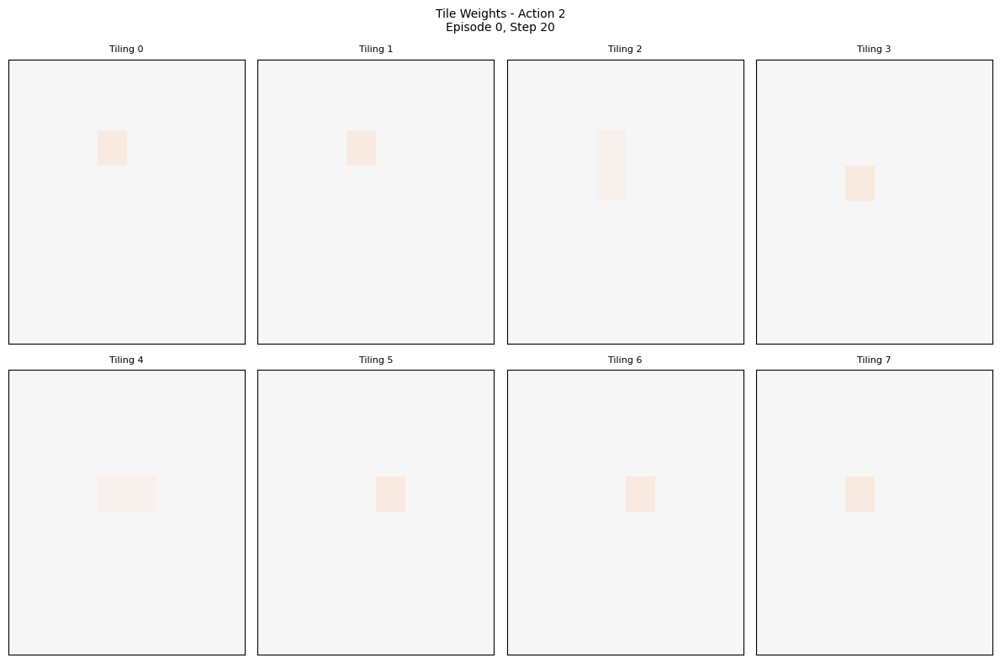

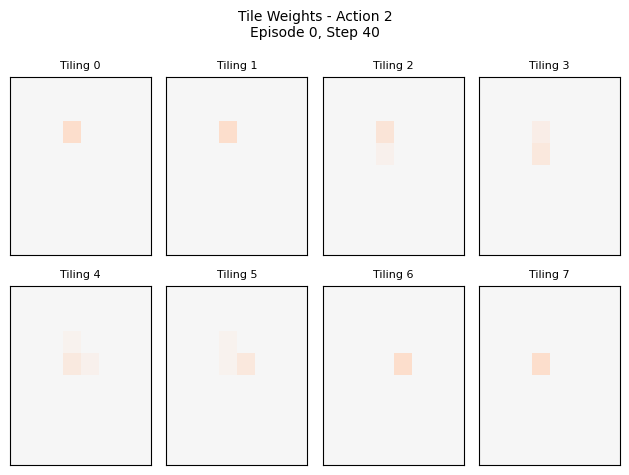

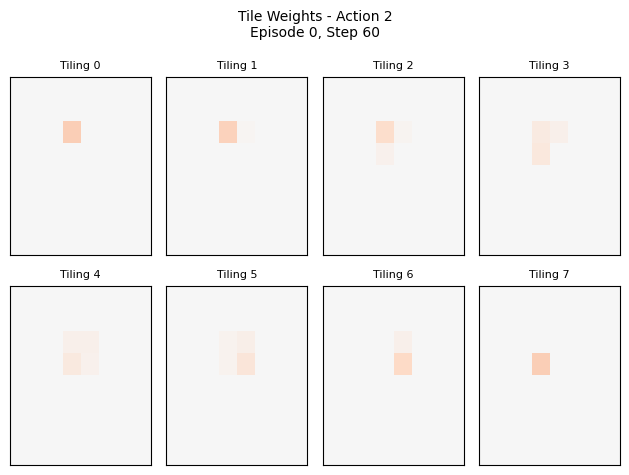

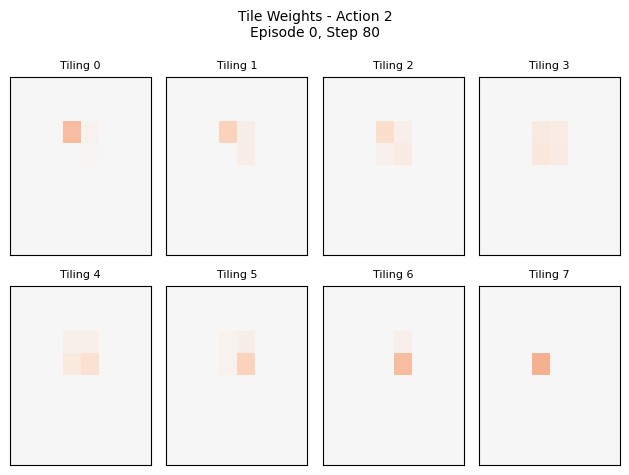

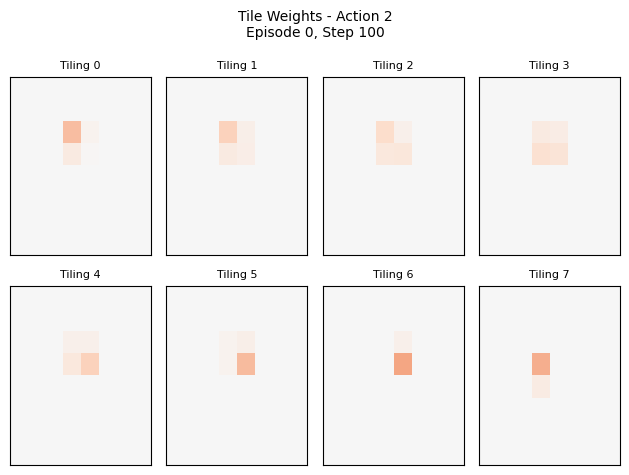

...

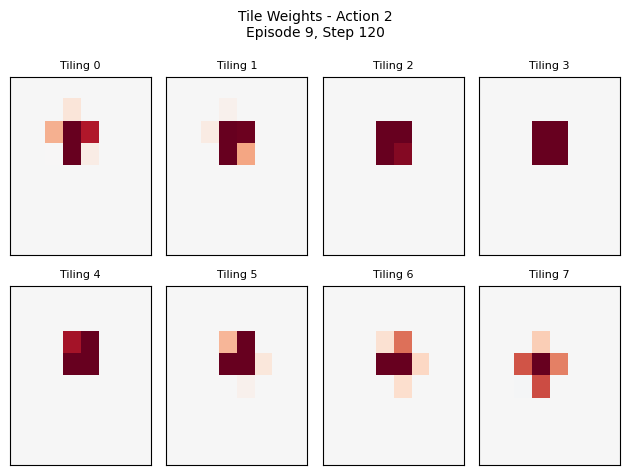

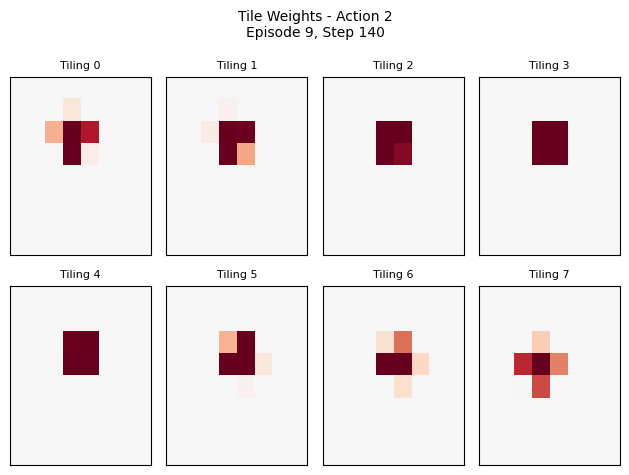

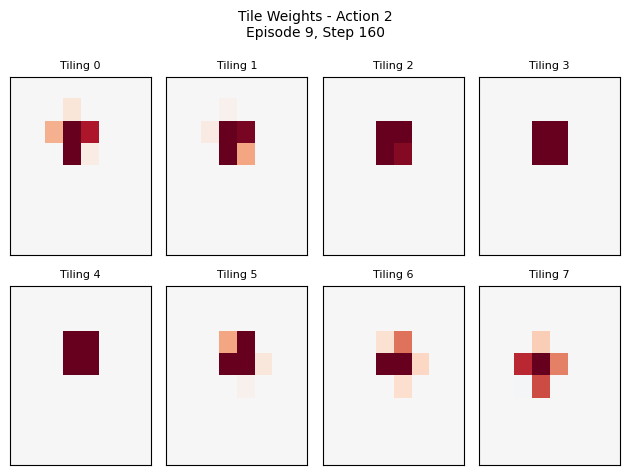

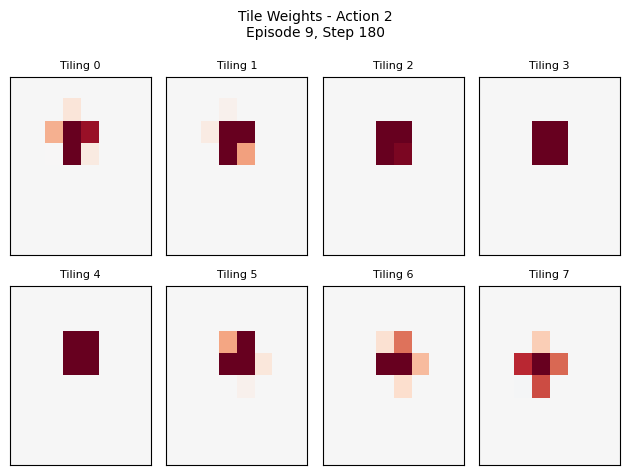

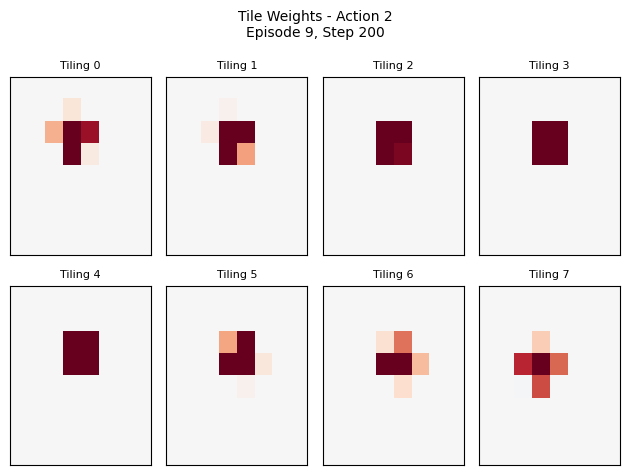

Episode 10: Return = -200.0, Steps = 200


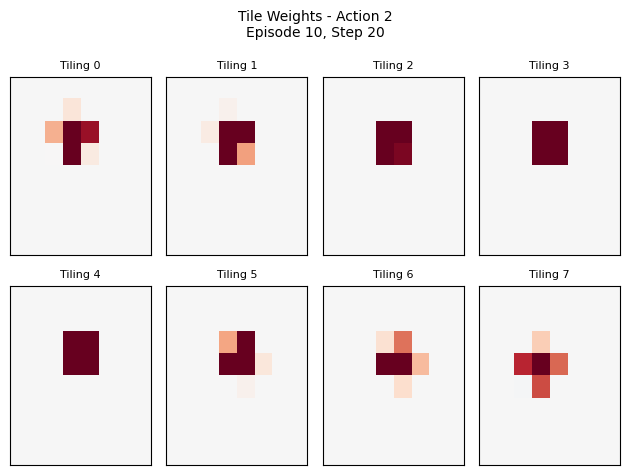

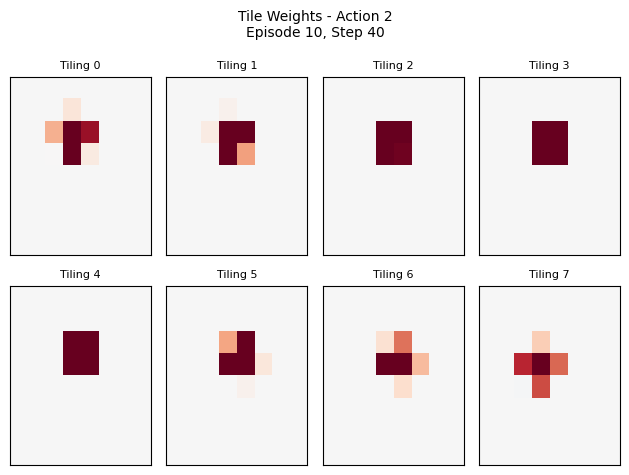

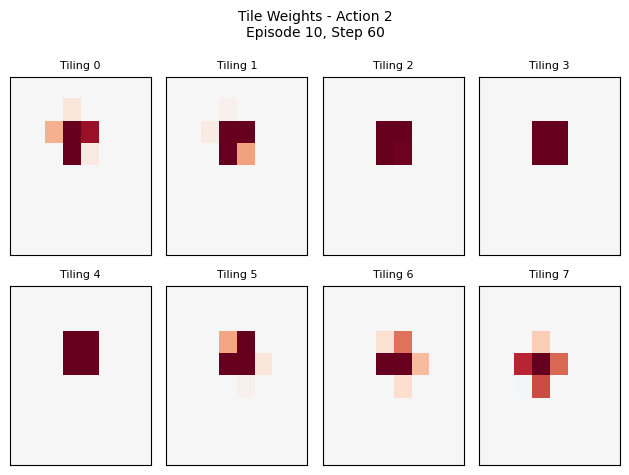

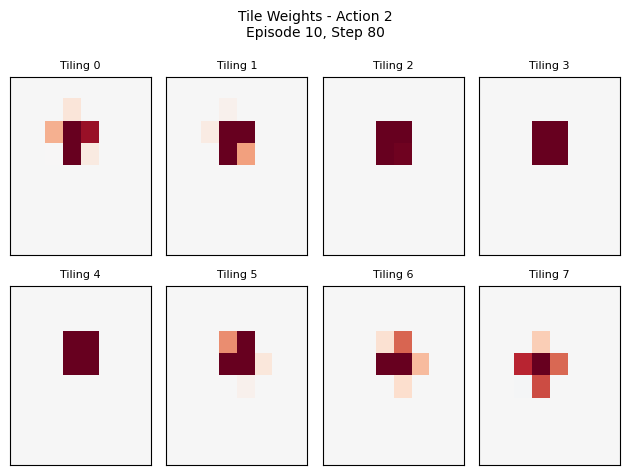

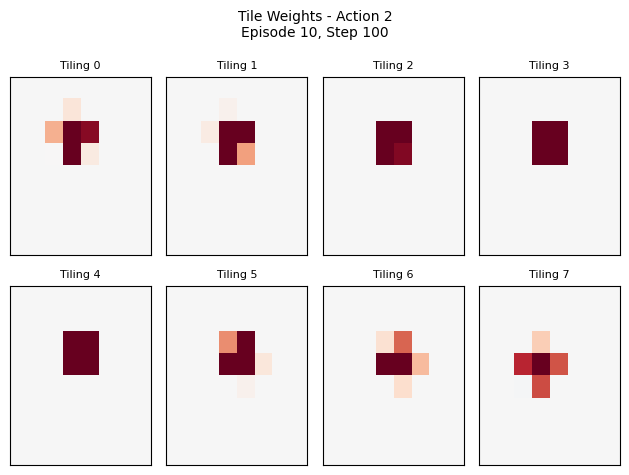

...

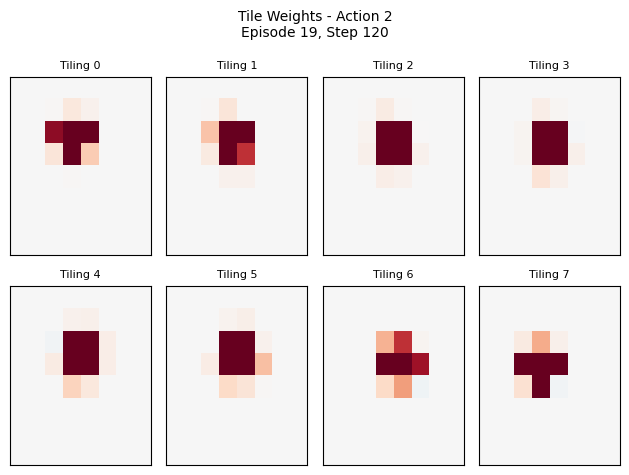

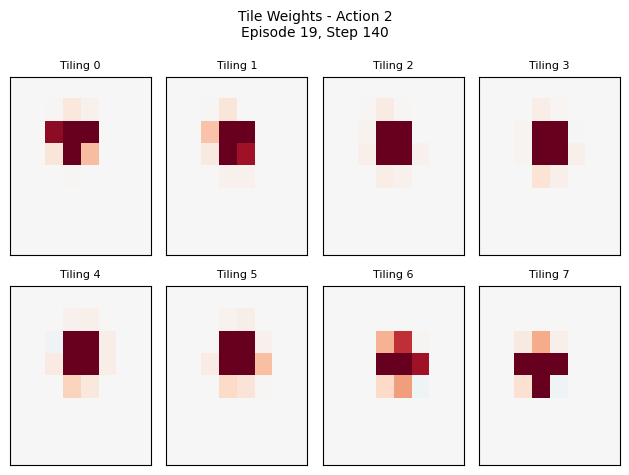

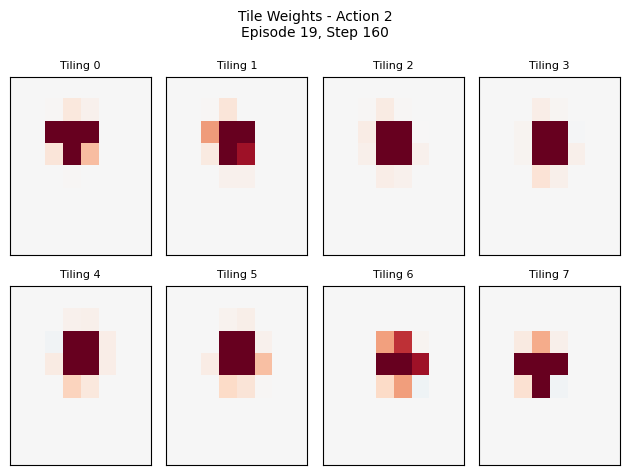

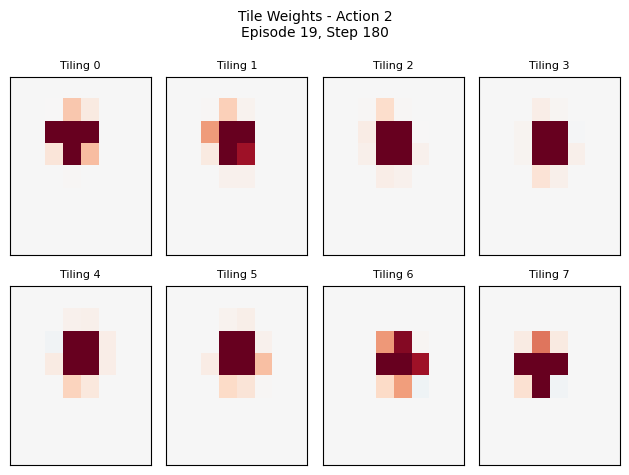

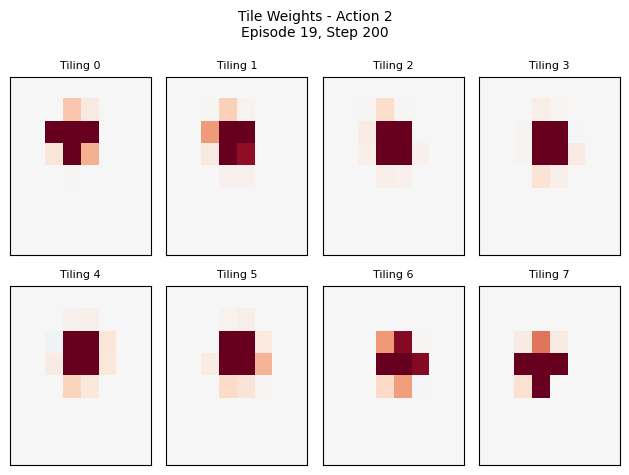

Episode 20: Return = -200.0, Steps = 200


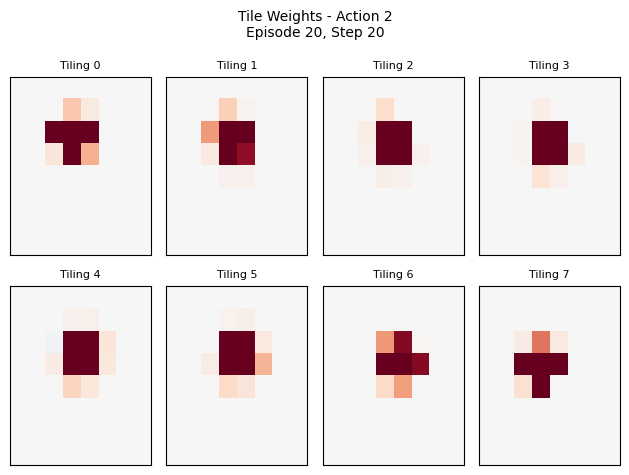

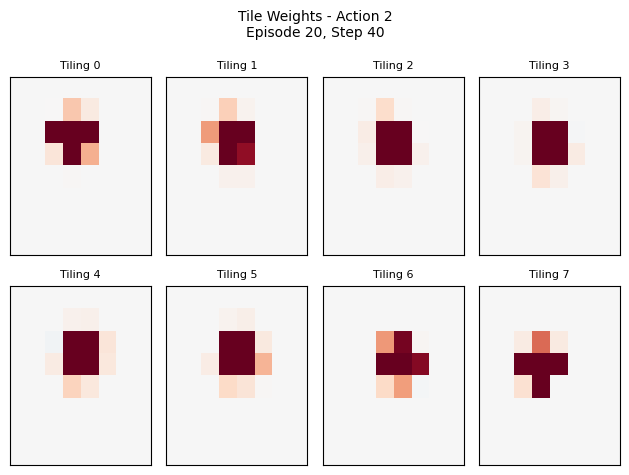

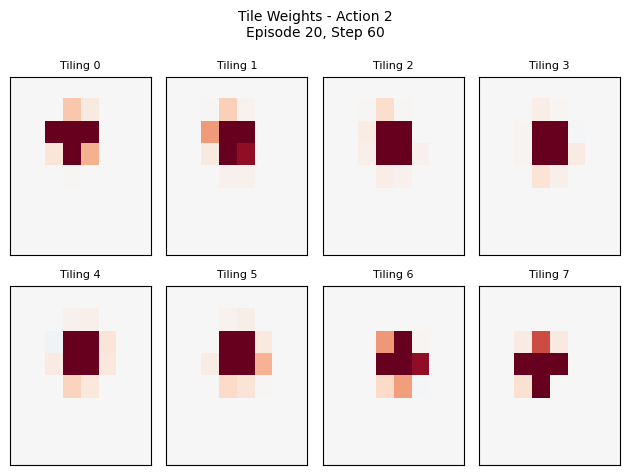

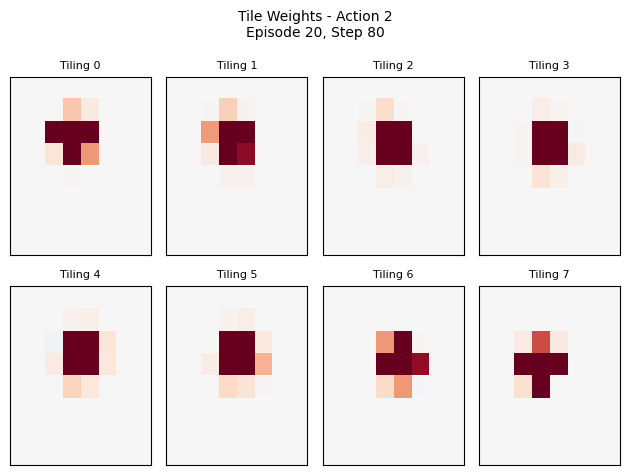

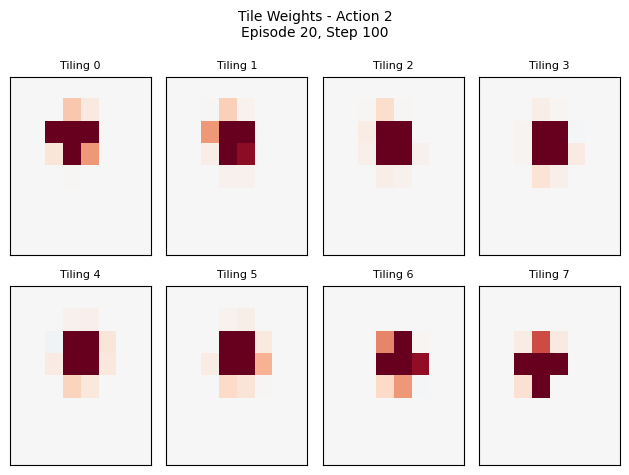

...

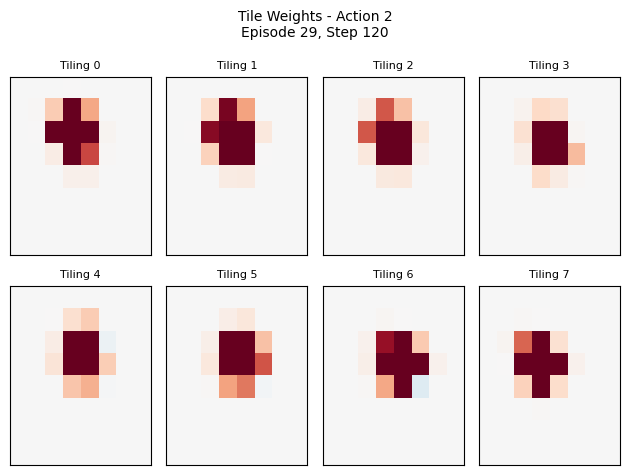

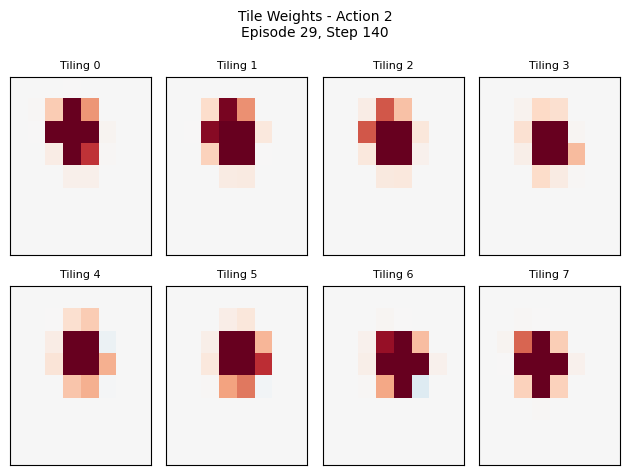

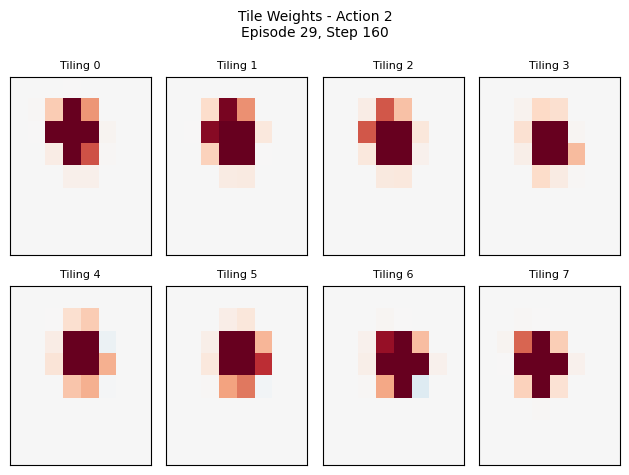

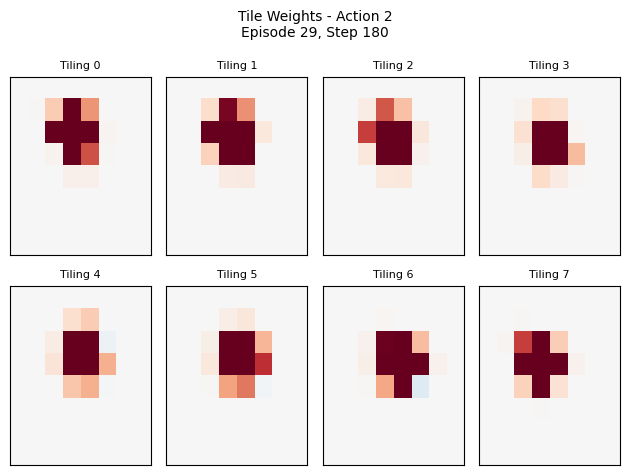

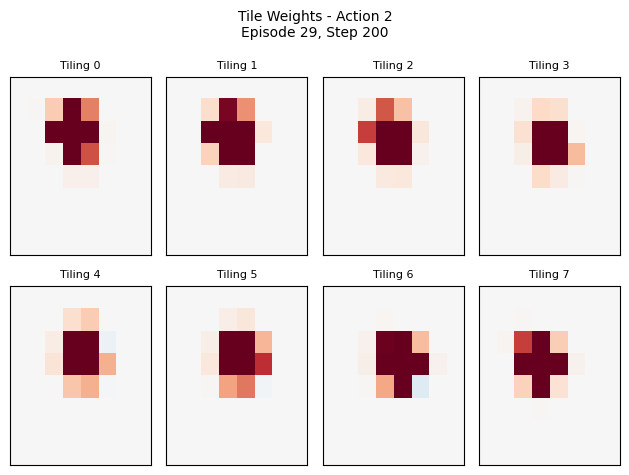

Episode 30: Return = -200.0, Steps = 200


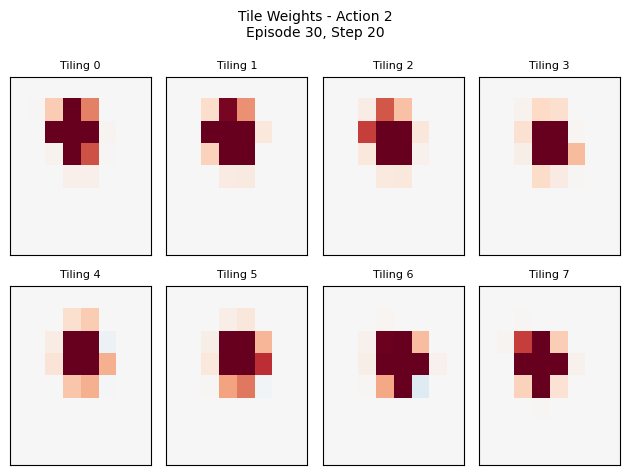

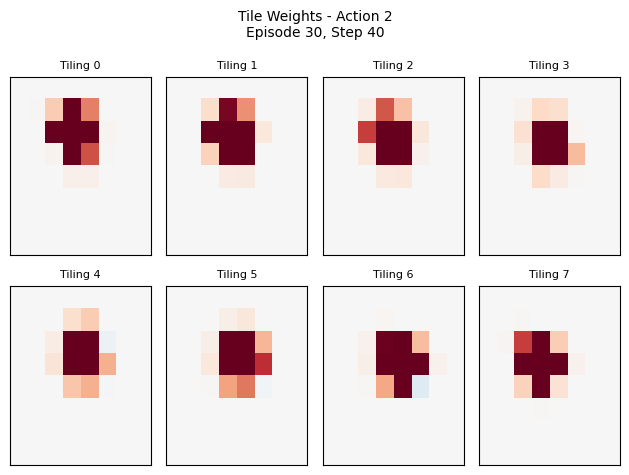

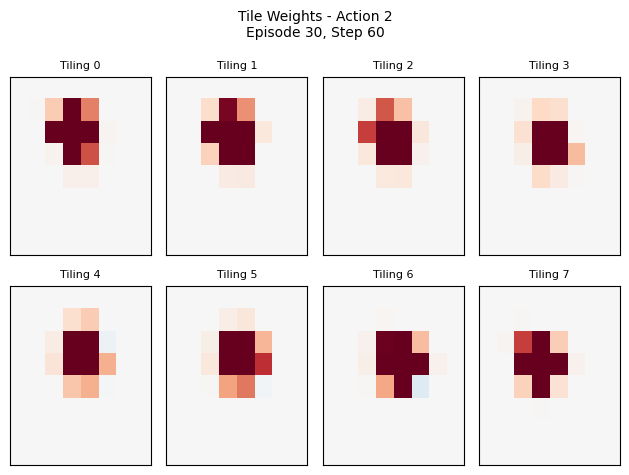

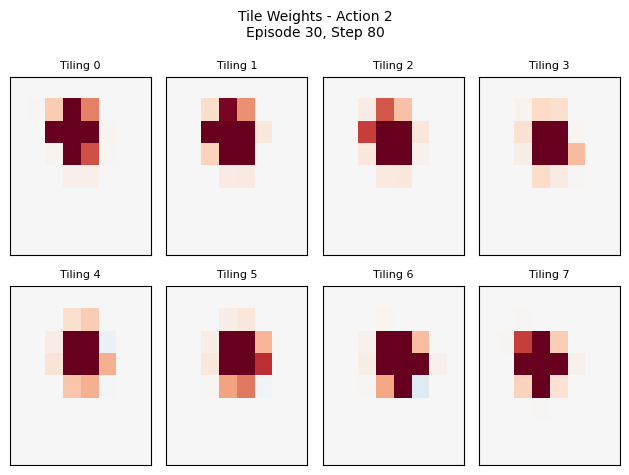

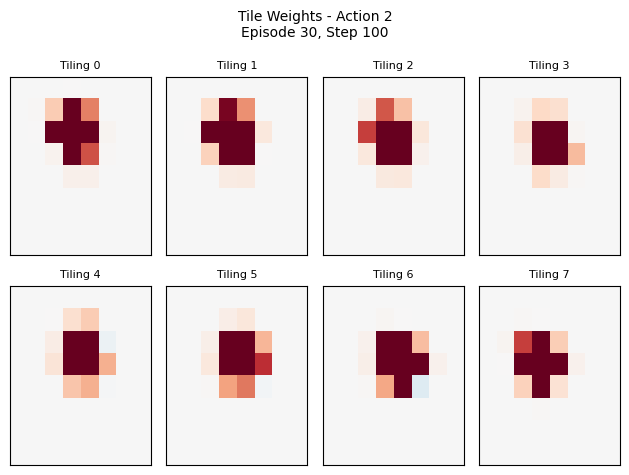

...

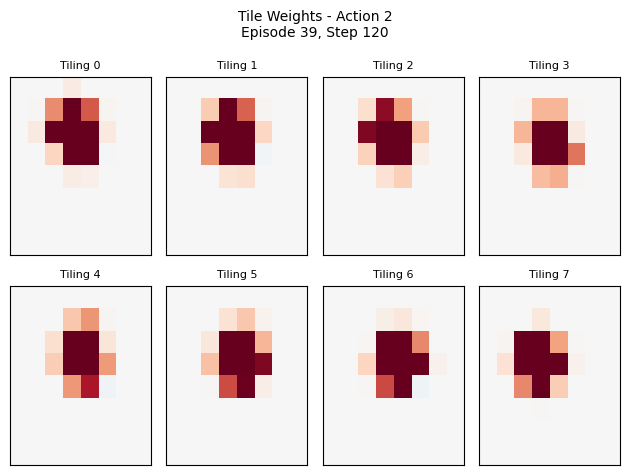

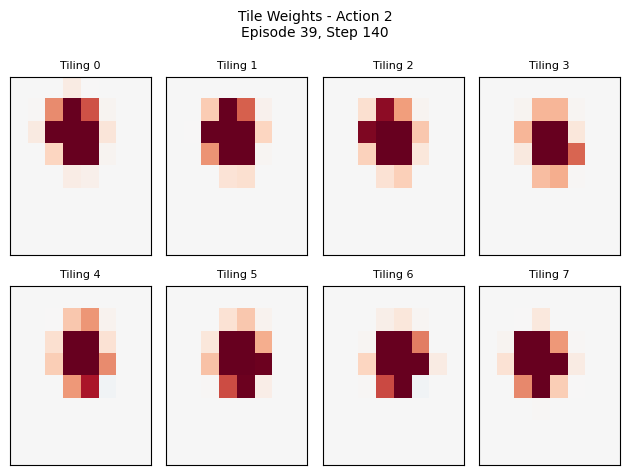

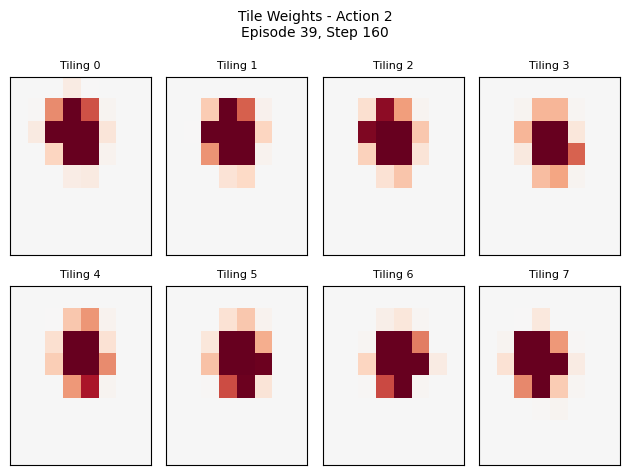

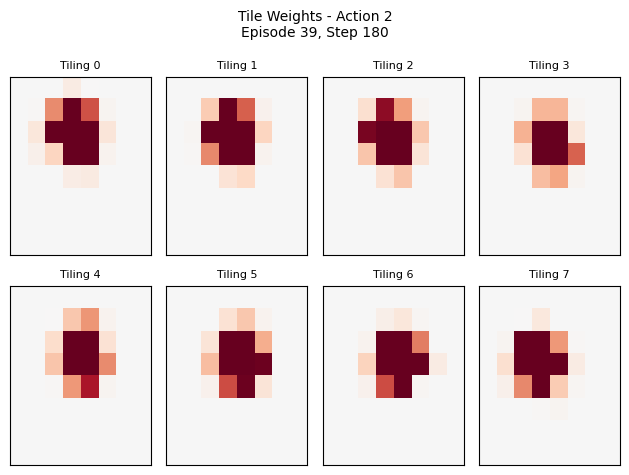

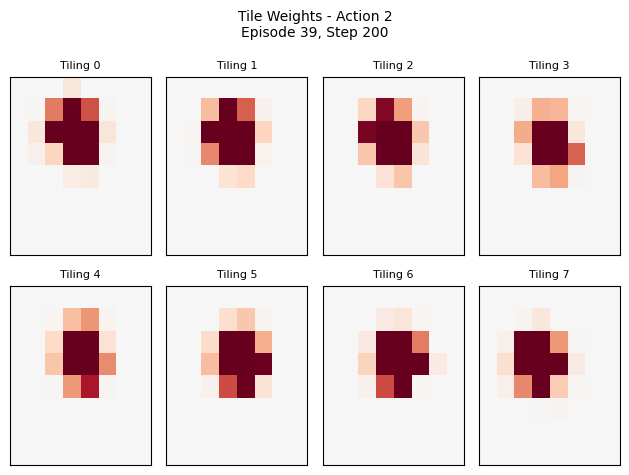

Episode 40: Return = -200.0, Steps = 200


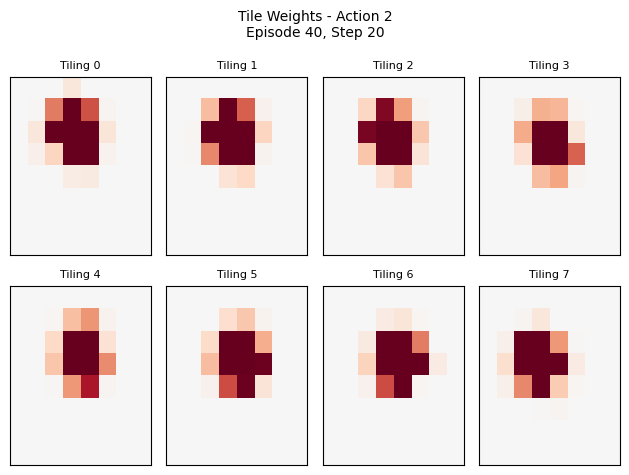

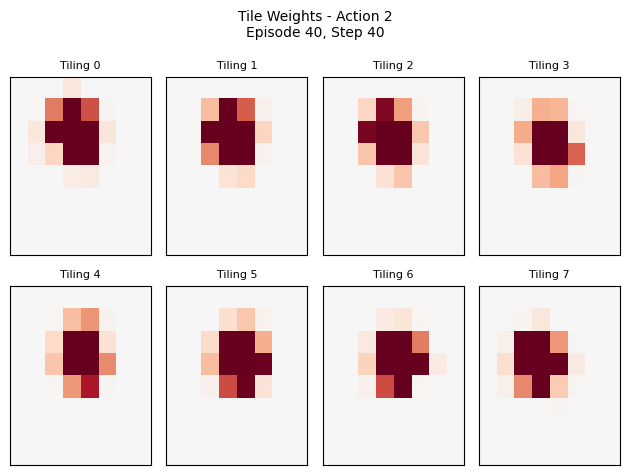

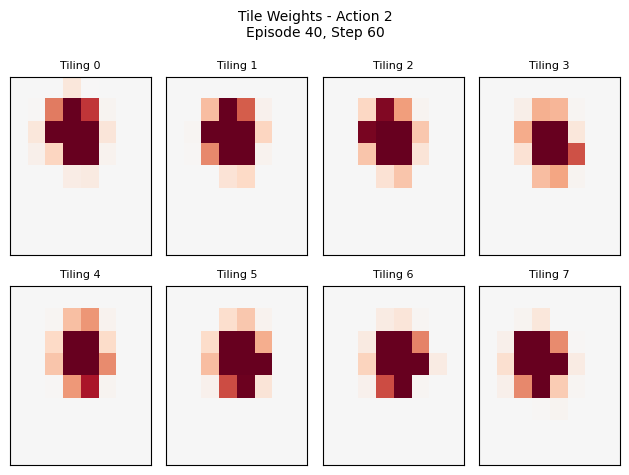

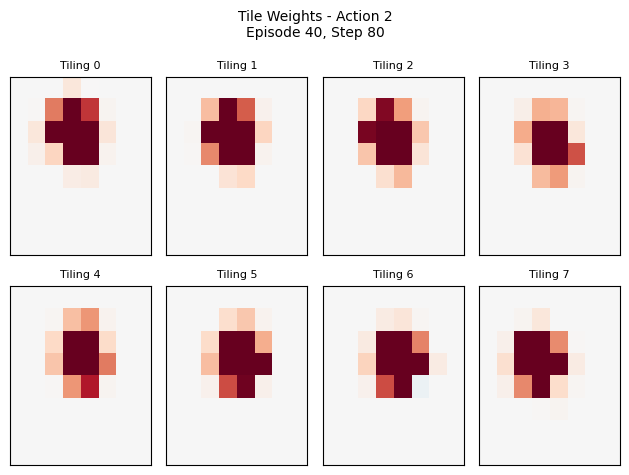

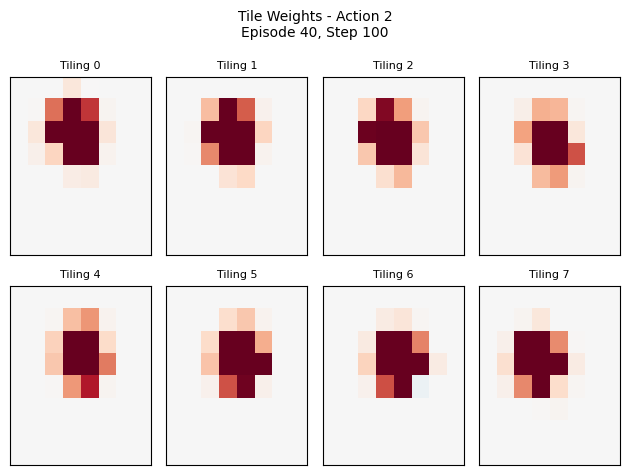

...

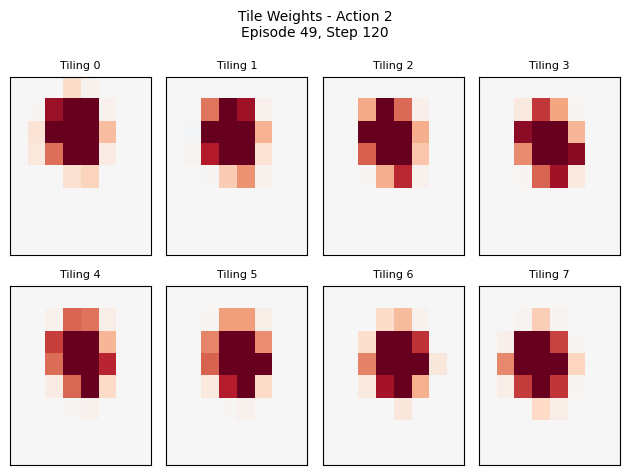

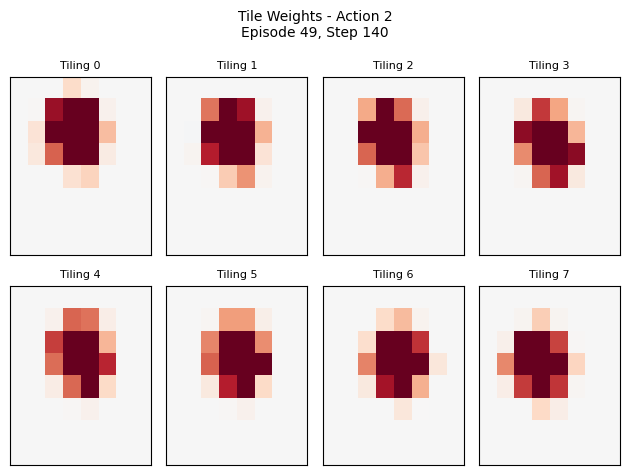

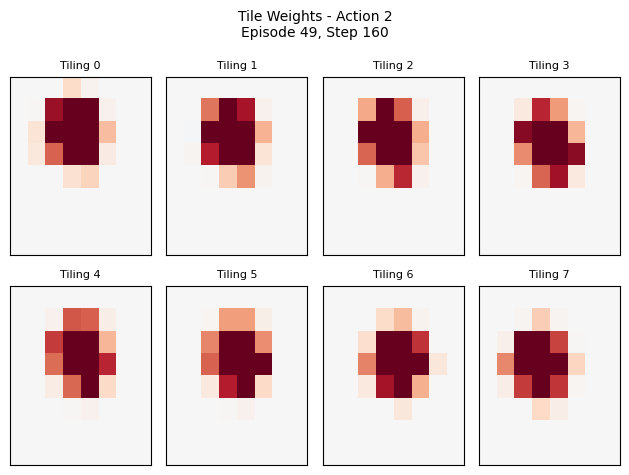

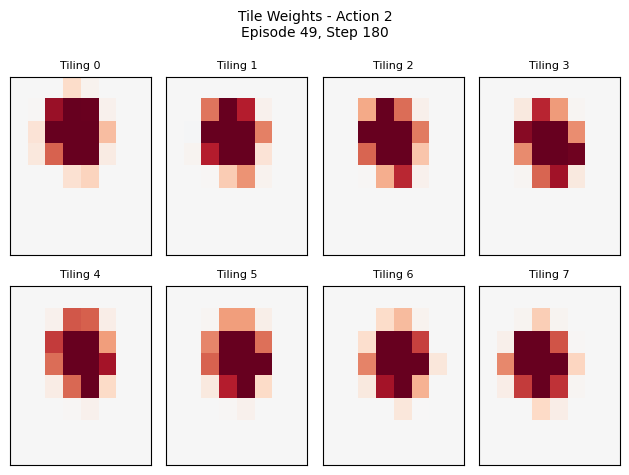

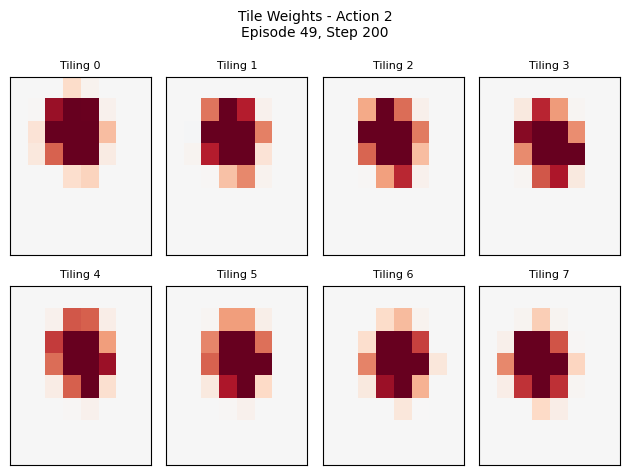

Episode 50: Return = -200.0, Steps = 200


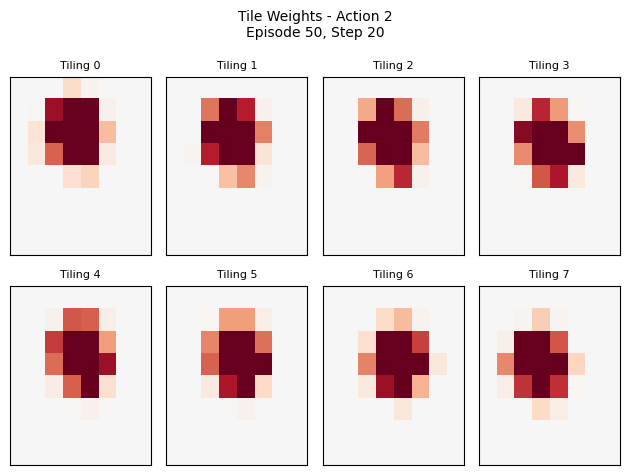

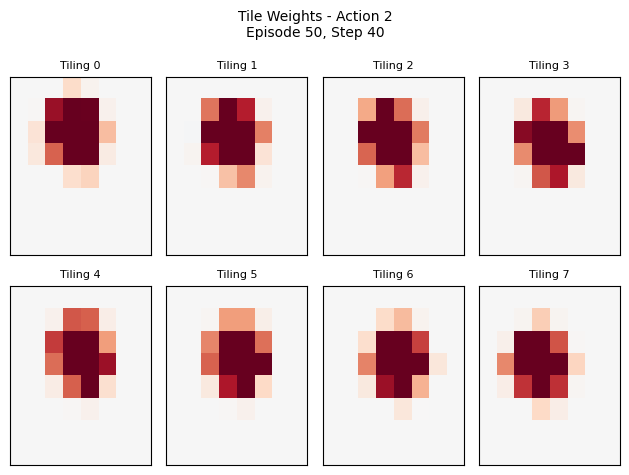

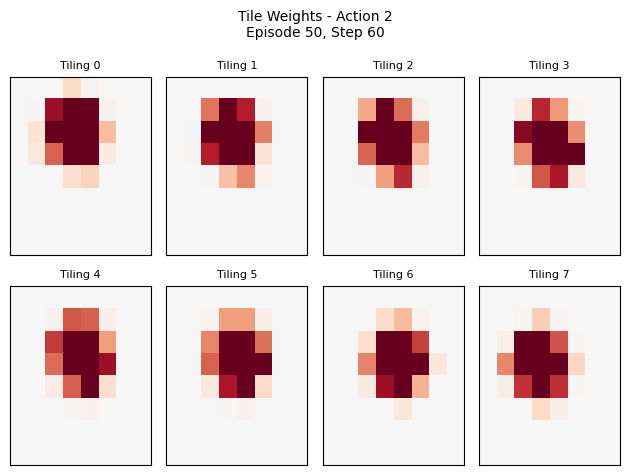

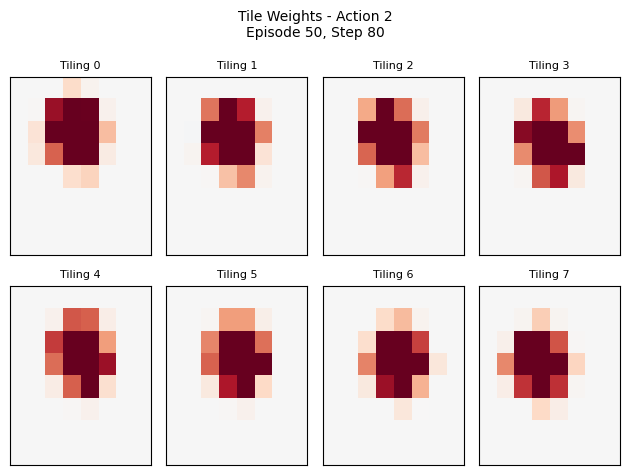

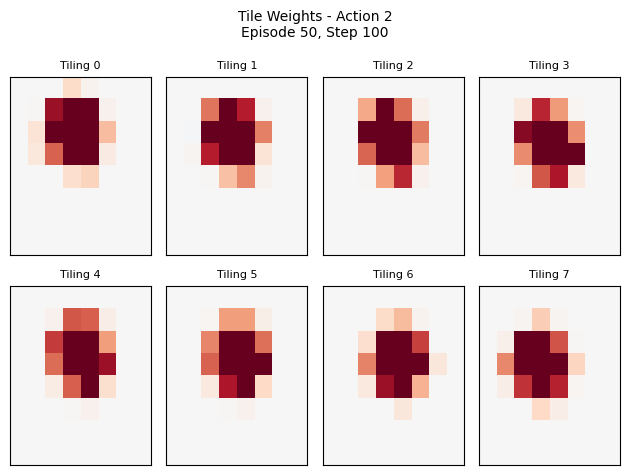

...

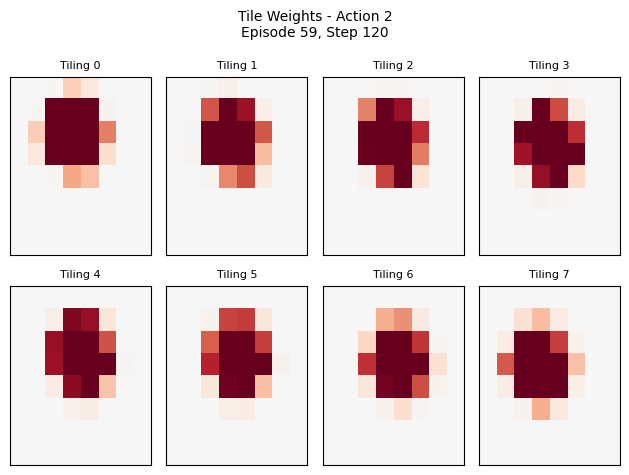

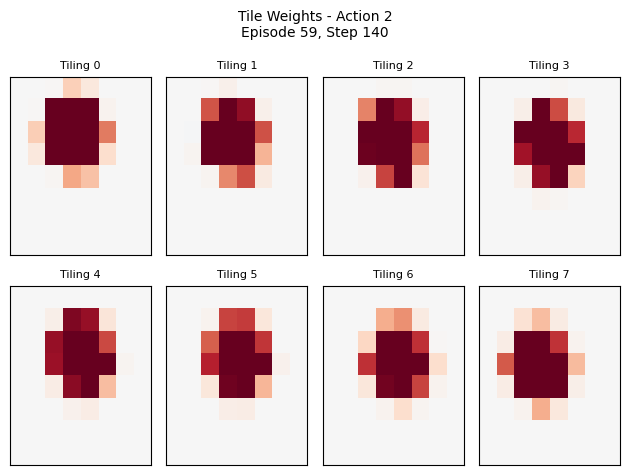

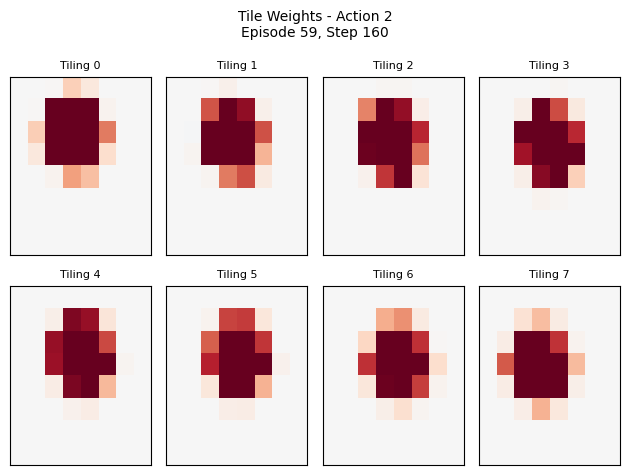

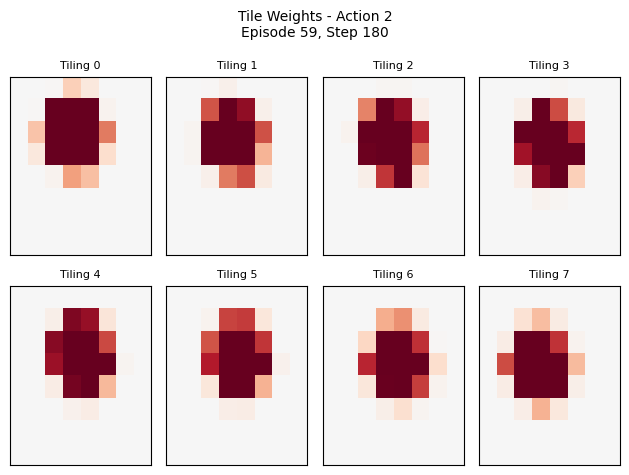

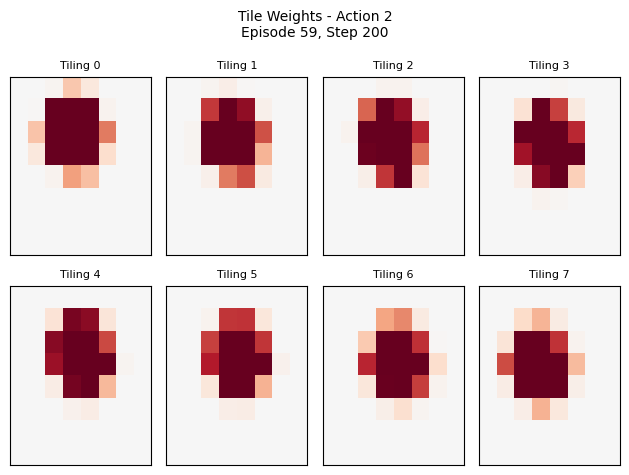

Episode 60: Return = -200.0, Steps = 200


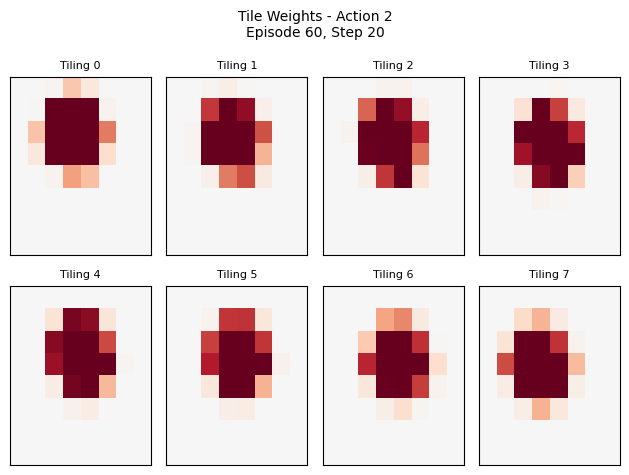

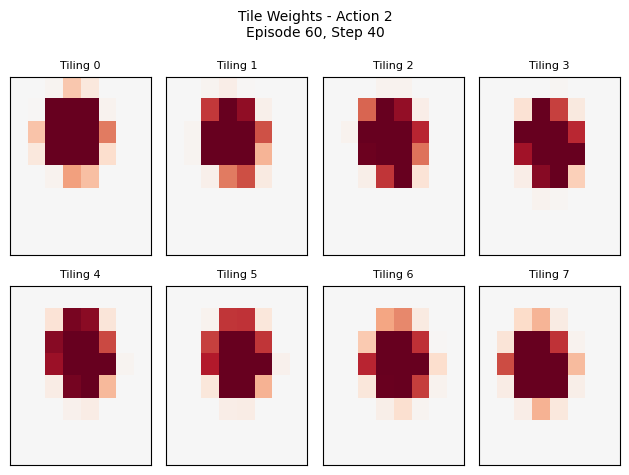

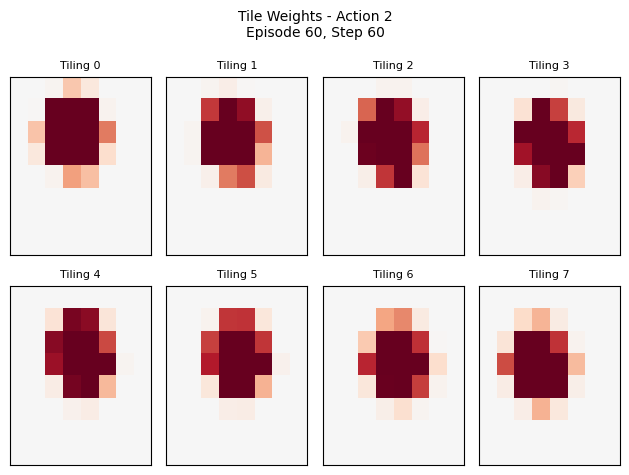

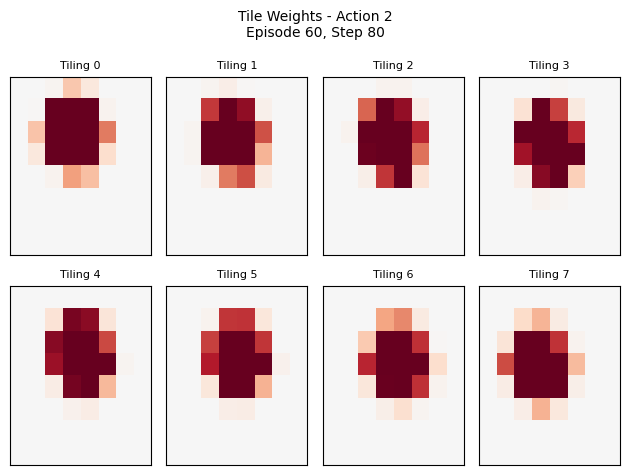

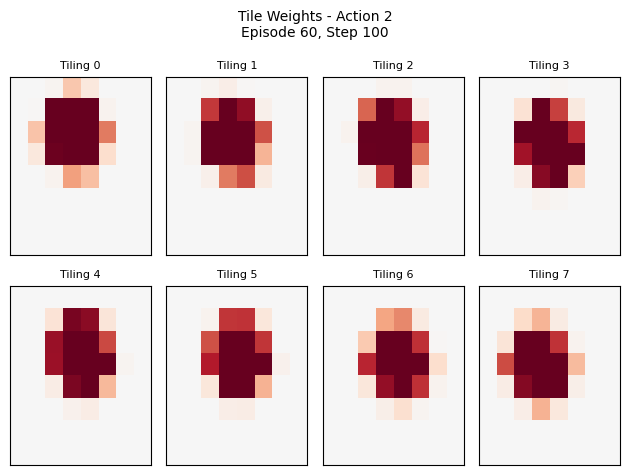

...

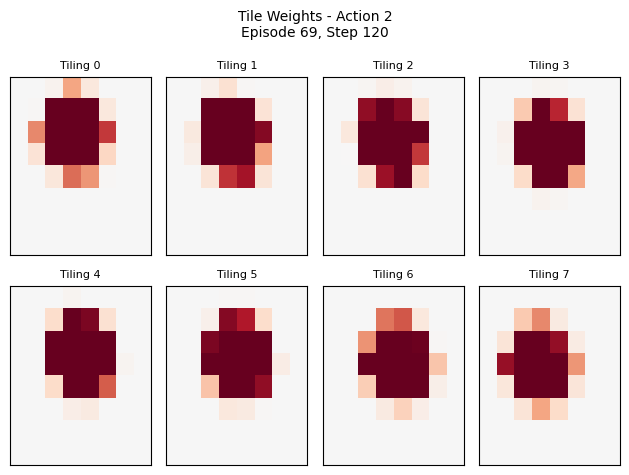

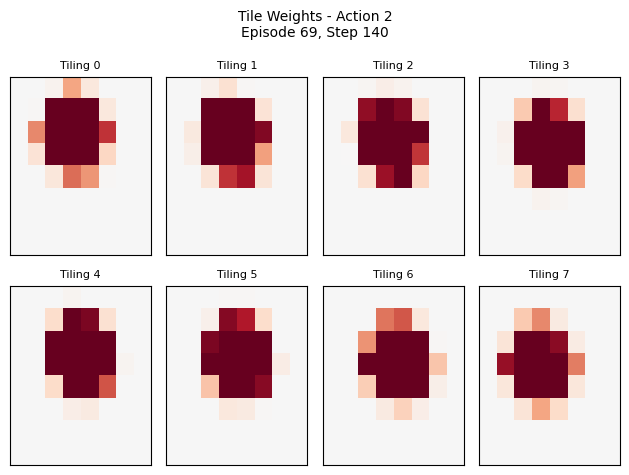

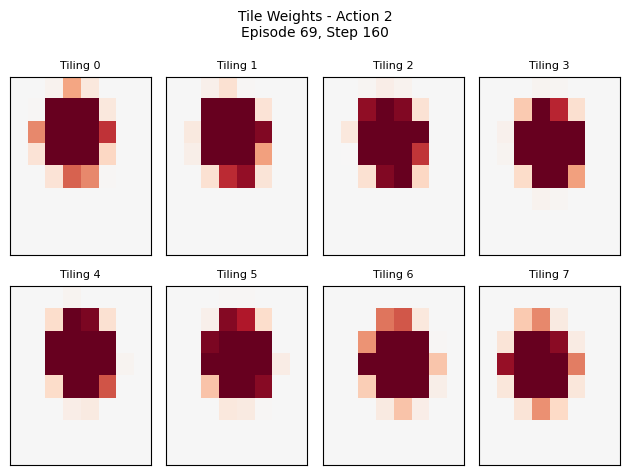

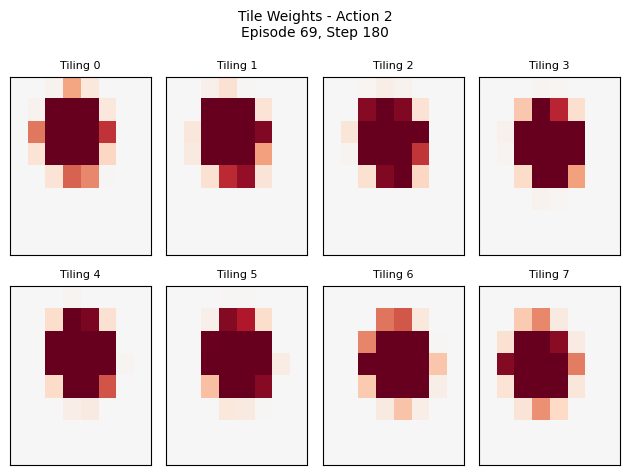

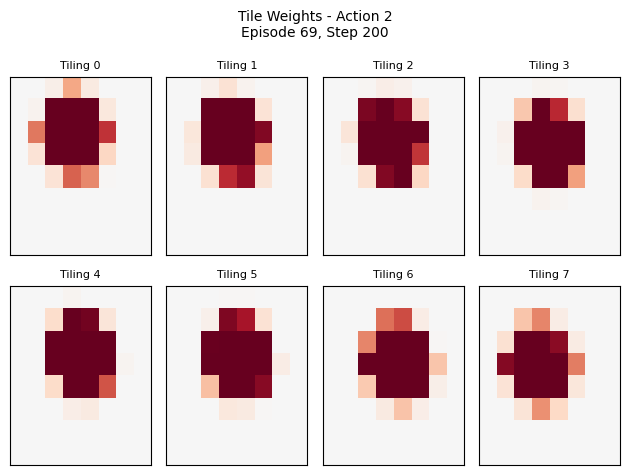

Episode 70: Return = -200.0, Steps = 200


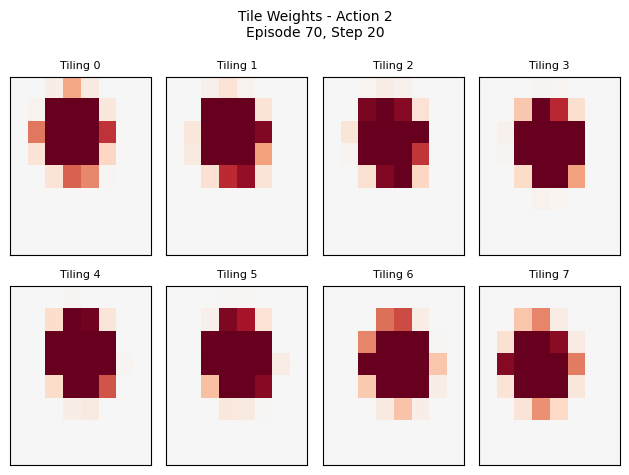

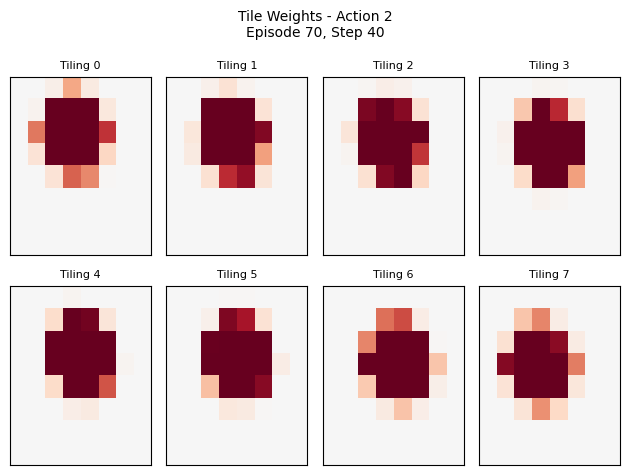

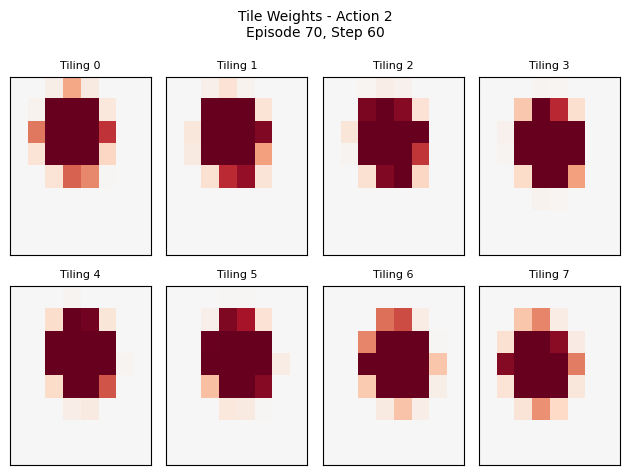

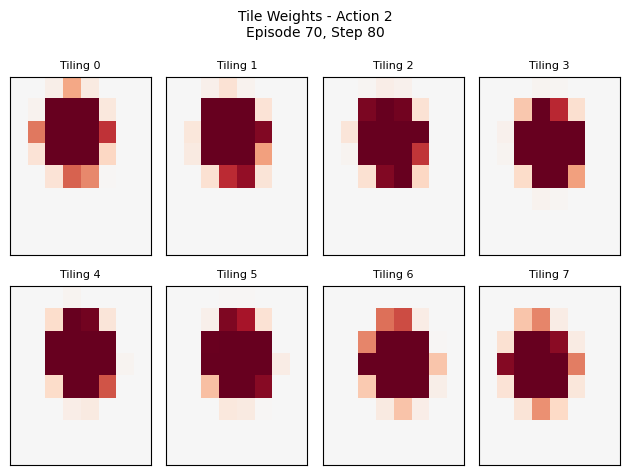

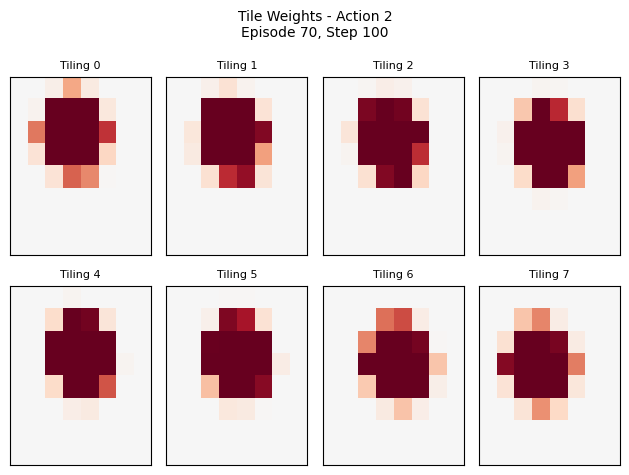

...

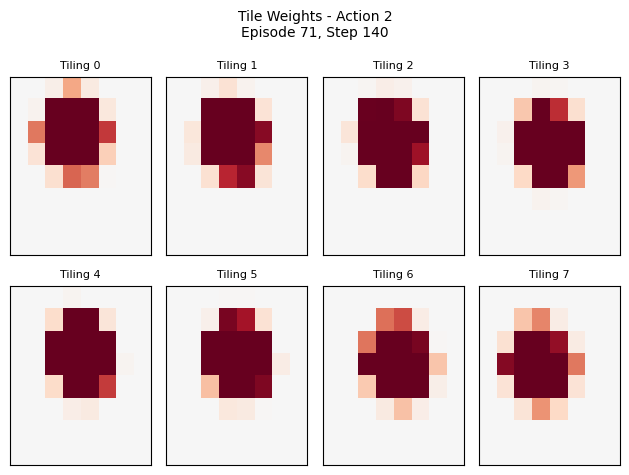

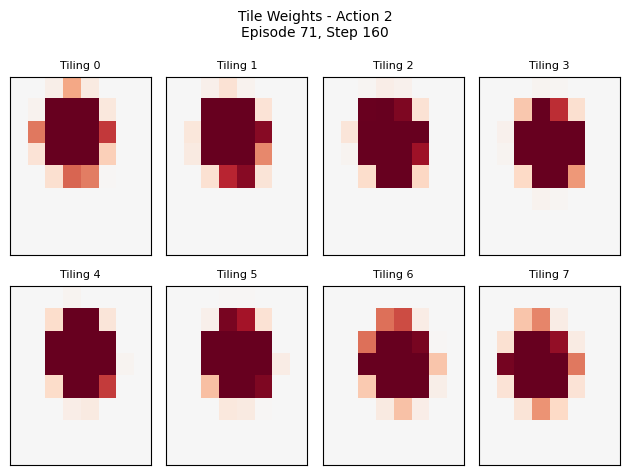

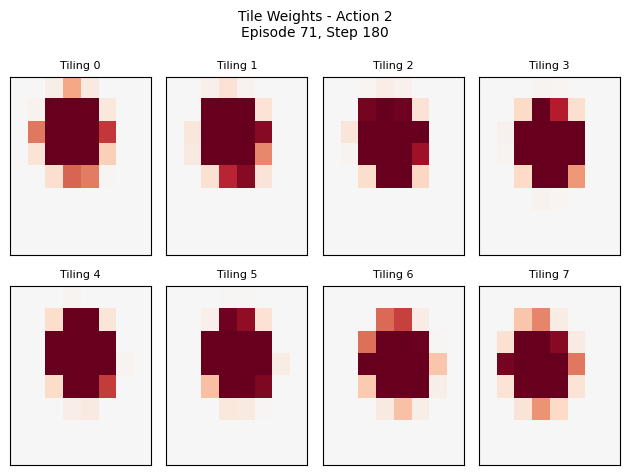

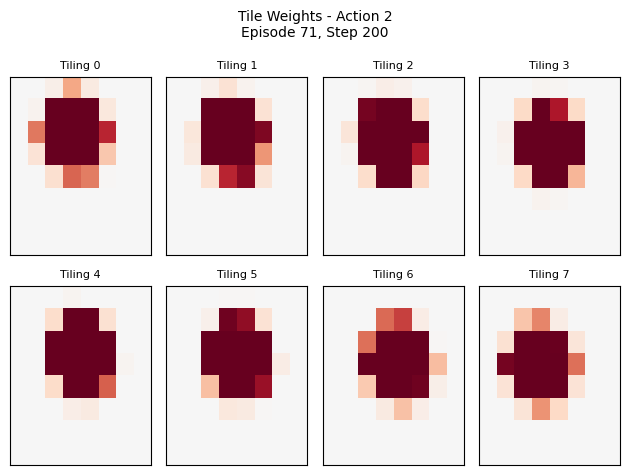

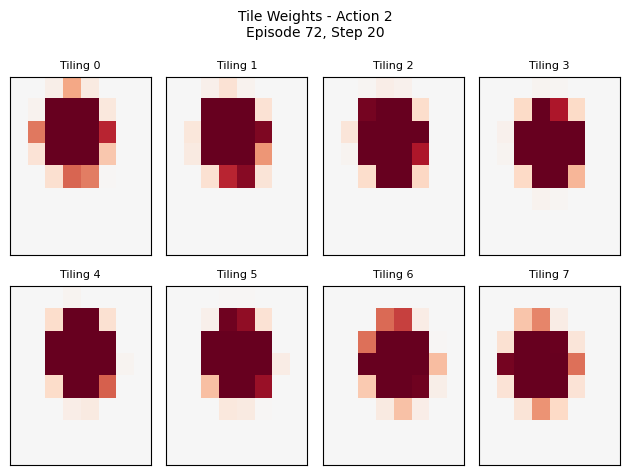

KeyboardInterrupt: 

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import gymnasium as gym

class TileCoderXY:
    """
    A TileCoder for function approximation that applies tile coding on the x and y coordinates
    of a 3D state. Instead of providing tile widths, the user provides the number of tiles per
    dimension. The tile widths are computed based on the state bounds and the number of tiles.
    The z coordinate is not used.
    """

    def __init__(self, num_tilings, tiles_per_dim, state_low, state_high):
        """
        Initialize the TileCoderXY.
        Parameters:
            num_tilings (int): Number of overlapping tilings.
            tiles_per_dim (array-like of 2 ints): Number of tiles along the x and y dimensions.
            state_low (array-like of 2 floats): Lower bounds for the x and y dimensions.
            state_high (array-like of 2 floats): Upper bounds for the x and y dimensions.
        """
        self.num_tilings = num_tilings
        self.tiles_per_dim = np.array(tiles_per_dim, dtype=int)
        self.state_low = np.array(state_low, dtype=float)
        self.state_high = np.array(state_high, dtype=float)

        # Compute the tile width for each dimension.
        # We assume that the grid spans exactly from state_low to state_high.
        # When there are N tiles, there are N-1 intervals between the boundaries.
        self.tile_width = (self.state_high - self.state_low) / (self.tiles_per_dim - 1)

        # Precompute an offset for each tiling to create overlapping grids.
        # self.offsets = [(i / self.num_tilings) * self.tile_width for i in range(self.num_tilings)]
        # self.offsets = self.compute_8_offsets()
        # self.offsets = np.stack(self._compute_offsets(), axis=0)  # shape: (num_tilings, dims)
        # Precompute offsets for each tiling.
        # For tiling i:
        #   offset_x = (((i + 0) % num_tilings) / num_tilings) * tile_width[0]
        #   offset_y = (((i + 1) % num_tilings) / num_tilings) * tile_width[1]
        offsets = np.empty((self.num_tilings, 2))
        for i in range(self.num_tilings):
            offsets[i, 0] = (((i + 0) % self.num_tilings) / self.num_tilings) * self.tile_width[0]
            offsets[i, 1] = (((i + 1) % self.num_tilings) / self.num_tilings) * self.tile_width[1]
        self.offsets = offsets


        # Precompute multiplier for flattening a 2D index.
        # For grid shape (N, M), flat index = x_index * M + y_index.
        self.multiplier = self.tiles_per_dim[1]

        # Initialize a weight vector for each tiling.
        num_tiles = np.prod(self.tiles_per_dim)
        self.weights = [np.zeros(num_tiles) for _ in range(self.num_tilings)]

    def save(self, file_name):
        np.savez(file_name + ".npz", weights=self.weights)

    def load(self, file_name):
        self.weights = np.load(file_name+".npz")["weights"]


    def compute_8_offsets(self):
        """
        Compute a list of offsets using a combination of cardinal and diagonal directions.
        The offsets include:
          - Center: [0, 0]
          - Cardinal: right, left, up, down (half-tile shifts)
          - Diagonal: up-right, up-left, down-right, down-left (half-tile shifts)

        If the number of tilings exceeds the number of unique offsets (9), the list is repeated.

        Returns:
            List of 2-element numpy arrays representing the offset for each tiling.
        """
        half_tile = self.tile_width / 8.0
        base_offsets = [
            np.array([0.0, 0.0]),  # Center (no shift)
            np.array([half_tile[0], 0.0]),  # Right
            np.array([-half_tile[0], 0.0]),  # Left
            np.array([0.0, half_tile[1]]),  # Up
            np.array([0.0, -half_tile[1]]),  # Down
            np.array([half_tile[0], half_tile[1]]),  # Up-right
            np.array([-half_tile[0], half_tile[1]]),  # Up-left
            np.array([half_tile[0], -half_tile[1]]),  # Down-right
            np.array([-half_tile[0], -half_tile[1]])  # Down-left
        ]
        offsets = []
        for i in range(self.num_tilings):
            offsets.append(base_offsets[i % len(base_offsets)])
        return offsets

    def get_tile_indices(self, state):
        """
        Compute the active tile indices for all tilings given a 2D state.

        Parameters:
            state (array-like of length 2): The input state [x, y].

        Returns:
            List of tuples (tiling_index, flat_tile_index) for each tiling.
        """
        state = np.array(state, dtype=float)  # shape: (2,)
        # Compute shifted states for all tilings in one vectorized operation.
        # Shape of shifted: (num_tilings, 2)
        shifted = (state - self.state_low) + self.offsets

        # Compute tile coordinates (integer indices) for each tiling.
        # Division is broadcasted over the offsets.
        tile_coords = (shifted / self.tile_width).astype(int)  # shape: (num_tilings, 2)

        # Clip to ensure indices are within bounds.
        tile_coords[:, 0] = np.clip(tile_coords[:, 0], 0, self.tiles_per_dim[0] - 1)
        tile_coords[:, 1] = np.clip(tile_coords[:, 1], 0, self.tiles_per_dim[1] - 1)

        # Compute flat indices for each tiling.
        # flat_index = x_index * (tiles_per_dim[1]) + y_index
        flat_indices = tile_coords[:, 0] * self.tiles_per_dim[1] + tile_coords[:, 1]

        # Return a list of (tiling_index, flat_index) tuples.
        return list(zip(range(self.num_tilings), flat_indices))


    def predict(self, state):
        """
        Compute the approximated function value for a given 3D state using tile coding on x and y.

        Parameters:
            state (array-like): The input state [x, y, z].

        Returns:
            float: The function approximation (sum of weights for the active tiles).
        """
        active_tiles = self.get_tile_indices(state)
        return sum(self.weights[tiling][idx] for tiling, idx in active_tiles)

    def update(self, state, target, alpha):
        """
        Update the weights given a state and target value.

        Parameters:
            state (array-like): The input state [x, y, z].
            target (float): The target function value.
            alpha (float): The overall learning rate.
        """
        prediction = self.predict(state)
        error = target - prediction
        # Distribute the learning rate equally among all tilings.
        alpha_per_tiling = alpha / self.num_tilings

        active_tiles = self.get_tile_indices(state)
        for tiling, idx in active_tiles:
            self.weights[tiling][idx] += alpha_per_tiling * error

# Q-function approximator using tile coding
class QFunction:
    """
    Represents Q(s, a) using separate tile coders for each action.
    """
    def __init__(self, num_actions, num_tilings, tiles_per_dim, state_low, state_high):
        self.num_actions = num_actions
        # Create a separate tile coder for each action
        self.tile_coders = [
            TileCoderXY(num_tilings, tiles_per_dim, state_low, state_high)
            for _ in range(num_actions)
        ]

    def get_q_value(self, state, action):
        """Get Q(s, a) for a specific action."""
        return self.tile_coders[action].predict(state)

    def get_all_q_values(self, state):
        """Get Q(s, a) for all actions."""
        return np.array([self.get_q_value(state, a) for a in range(self.num_actions)])

    def update(self, state, action, target, alpha):
        """Update Q(s, a) towards target."""
        self.tile_coders[action].update(state, target, alpha)


def epsilon_greedy(q_function, state, epsilon):
    """
    Choose an action using epsilon-greedy policy.
    """
    if np.random.rand() < epsilon:
        return np.random.randint(q_function.num_actions)
    else:
        q_values = q_function.get_all_q_values(state)
        return np.argmax(q_values)

def sarsa_with_tile_visualization(env, q_function, num_episodes, alpha, gamma, epsilon,
                                   visualize_every=10, action_to_visualize=2):
    """
    SARSA with real-time tile weight visualization.

    Args:
        visualize_every: Update visualization every N steps
        action_to_visualize: Which action's tiles to show (0=left, 1=none, 2=right)
    """
    plt.ion()  # Turn on interactive mode
    fig = plt.figure(figsize=(12, 8))

    episode_returns = []
    episode_lengths = []

    for episode in range(num_episodes):
        state = env.reset()
        if isinstance(state, tuple):
            state = state[0]

        action = epsilon_greedy(q_function, state, epsilon)
        total_return = 0
        steps = 0
        done = False

        while not done:
            result = env.step(action)
            if len(result) == 5:
                next_state, reward, terminated, truncated, _ = result
                done = terminated or truncated
            else:
                next_state, reward, done, _ = result

            total_return += reward
            steps += 1

            next_action = epsilon_greedy(q_function, next_state, epsilon)

            if done:
                td_target = reward
            else:
                q_next = q_function.get_q_value(next_state, next_action)
                td_target = reward + gamma * q_next

            # Update weights
            q_function.update(state, action, td_target, alpha)

            # Visualize tile weights periodically
            if steps % visualize_every == 0:
                visualize_tile_weights_realtime(q_function, action_to_visualize,
                                               episode, steps)

            state = next_state
            action = next_action

        episode_returns.append(total_return)
        episode_lengths.append(steps)

        epsilon = max(0.01, epsilon * 0.995)

        if (episode + 1) % 10 == 0:
            print(f"Episode {episode + 1}: Return = {total_return}, Steps = {steps}")

    plt.ioff()
    plt.close(fig)

    return episode_returns, episode_lengths

def run_random_policy(env, num_episodes=100):
    """Run random policy as baseline."""
    returns = []
    lengths = []

    for _ in range(num_episodes):
        state = env.reset()
        if isinstance(state, tuple):
            state = state[0]

        done = False
        total_return = 0
        steps = 0

        while not done:
            action = env.action_space.sample()
            result = env.step(action)

            if len(result) == 5:
                _, reward, terminated, truncated, _ = result
                done = terminated or truncated
            else:
                _, reward, done, _ = result

            total_return += reward
            steps += 1

        returns.append(total_return)
        lengths.append(steps)

    return returns, lengths


def visualize_tile_weights_realtime(q_function, action, episode, step):
        """
        Visualize the weights of all tiles for a specific action in real-time.
        Shows how tile weights evolve during learning.

        Args:
        q_function: The Q-function with tile coders
        action: Which action's tiles to visualize
        episode: Current episode number
        step: Current step number
        """
        tile_coder = q_function.tile_coders[action]
        num_tilings = tile_coder.num_tilings
        tiles_per_dim = tile_coder.tiles_per_dim

        # Create subplot grid
        cols = 4
        rows = (num_tilings + cols - 1) // cols

        plt.clf()  # Clear current figure

        for tiling_idx in range(num_tilings):
            ax = plt.subplot(rows, cols, tiling_idx + 1)

            # Reshape flat weights back to 2D grid
            weights = tile_coder.weights[tiling_idx].reshape(tiles_per_dim[0], tiles_per_dim[1])

            # Plot heatmap of weights
            im = ax.imshow(weights, cmap='RdBu', aspect='auto',
                        vmin=-1, vmax=1)  # Adjust vmin/vmax as needed
            ax.set_title(f'Tiling {tiling_idx}', fontsize=8)
            ax.set_xticks([])
            ax.set_yticks([])

        plt.suptitle(f'Tile Weights - Action {action}\nEpisode {episode}, Step {step}',
                    fontsize=10)
        plt.tight_layout()
        plt.pause(0.01)  # Small pause to update display

def visualize_tiles_live(q_function, state, action, ax_tiles):
    """
    Visualize which tiles are currently active for a given state-action pair.
    """
    ax_tiles.clear()

    # Get the tile coder for this action
    tile_coder = q_function.tile_coders[action]

    # Get active tile indices
    active_tiles = tile_coder.get_tile_indices(state)

    # Create visualization grid
    tiles_per_dim = tile_coder.tiles_per_dim

    # Show each tiling
    num_tilings = tile_coder.num_tilings
    cols = 4
    rows = (num_tilings + cols - 1) // cols

    for tiling_idx in range(num_tilings):
        ax = plt.subplot(rows, cols, tiling_idx + 1)
        grid = np.zeros((tiles_per_dim[0], tiles_per_dim[1]))

        # Find which tile is active in this tiling
        for tiling, flat_idx in active_tiles:
            if tiling == tiling_idx:
                # Convert flat index back to 2D coordinates
                x_idx = flat_idx // tiles_per_dim[1]
                y_idx = flat_idx % tiles_per_dim[1]
                grid[x_idx, y_idx] = 1.0

        ax.imshow(grid, cmap='RdYlGn', vmin=0, vmax=1, aspect='auto')
        ax.set_title(f'Tiling {tiling_idx}', fontsize=8)
        ax.set_xticks([])
        ax.set_yticks([])

    plt.suptitle(f'Active Tiles for Action {action}\nState: pos={state[0]:.3f}, vel={state[1]:.3f}',
                 fontsize=10)
    plt.tight_layout()


def demo_learned_policy(env, q_function, num_episodes=5, show_tiles=False):
    """
    Demonstrate the learned policy by running episodes with rendering.

    Args:
        show_tiles: If True, show tile activations in a separate window
    """
    print("\n" + "="*70)
    print("DEMONSTRATING LEARNED POLICY")
    print("="*70)

    if show_tiles:
        fig_tiles = plt.figure(figsize=(12, 8))
        plt.ion()  # Interactive mode

    for episode in range(num_episodes):
        state = env.reset()
        if isinstance(state, tuple):
            state = state[0]

        done = False
        total_return = 0
        steps = 0

        print(f"\nEpisode {episode + 1}:")

        while not done:
            # Render the environment
            env.render()

            # Choose action greedily (no exploration)
            q_values = q_function.get_all_q_values(state)
            action = np.argmax(q_values)

            # Visualize tiles if requested
            if show_tiles:
                visualize_tiles_live(q_function, state, action, fig_tiles)
                plt.pause(0.05)  # Pause to see the tiles

            # Take action
            result = env.step(action)
            if len(result) == 5:
                next_state, reward, terminated, truncated, _ = result
                done = terminated or truncated
            else:
                next_state, reward, done, _ = result

            total_return += reward
            steps += 1
            state = next_state

        print(f"  Steps: {steps}, Return: {total_return}")

    if show_tiles:
        plt.ioff()
        plt.close(fig_tiles)

    print("="*70)
    """
    Visualize the learned value function V(s) = max_a Q(s,a).
    """
    # Create grid of states
    position_range = np.linspace(env.observation_space.low[0],
                                 env.observation_space.high[0], 100)
    velocity_range = np.linspace(env.observation_space.low[1],
                                 env.observation_space.high[1], 100)

    V = np.zeros((len(position_range), len(velocity_range)))

    for i, pos in enumerate(position_range):
        for j, vel in enumerate(velocity_range):
            state = np.array([pos, vel])
            q_values = q_function.get_all_q_values(state)
            V[i, j] = np.max(q_values)

    plt.figure(figsize=(10, 6))
    plt.contourf(velocity_range, position_range, V, levels=20, cmap='viridis')
    plt.colorbar(label='Value V(s)')
    plt.xlabel('Velocity', fontsize=12)
    plt.ylabel('Position', fontsize=12)
    plt.title('Learned Value Function V(s) = max_a Q(s,a)', fontsize=14)
    plt.axhline(y=0.5, color='red', linestyle='--', linewidth=2, label='Goal')
    plt.legend()
    plt.tight_layout()
    plt.show()


# Main execution
print("="*70)
print("MountainCar-v0 with SARSA and Tile Coding")
print("="*70)

# Create environment - use render_mode for visualization
try:
    # Try new gym API with render mode
    env = gym.make('MountainCar-v0', render_mode='human')
    env_for_demo = env
except:
    # Fall back to old API
    env = gym.make('MountainCar-v0')
    env_for_demo = gym.make('MountainCar-v0')

# Environment info
print(f"\nEnvironment Info:")
print(f"  State space: {env.observation_space}")
print(f"  Action space: {env.action_space}")
print(f"  State bounds: [{env.observation_space.low}, {env.observation_space.high}]")

# Run random policy baseline
print("\n" + "="*70)
print("Running Random Policy Baseline...")
print("="*70)
random_returns, random_lengths = run_random_policy(env, num_episodes=100)
print(f"Random Policy Results:")
print(f"  Average Return: {np.mean(random_returns):.2f}")
print(f"  Average Length: {np.mean(random_lengths):.2f}")

# SARSA Hyperparameters
num_episodes = 500
alpha = 0.1          # Learning rate
gamma = 1.0          # Discount factor (no discounting for episodic tasks)
epsilon = 1.0        # Initial exploration rate
epsilon_decay = 0.995
epsilon_min = 0.01

# Tile coding parameters
num_tilings = 8
tiles_per_dim = [8, 8]  # 8x8 grid for each tiling
state_low = env.observation_space.low
state_high = env.observation_space.high

# Create Q-function
q_function = QFunction(
    num_actions=env.action_space.n,
    num_tilings=num_tilings,
    tiles_per_dim=tiles_per_dim,
    state_low=state_low,
    state_high=state_high
)

# Train with SARSA
print("\n" + "="*70)
print("Training with SARSA...")
print("="*70)
print(f"Hyperparameters:")
print(f"  Episodes: {num_episodes}")
print(f"  Alpha: {alpha}")
print(f"  Gamma: {gamma}")
print(f"  Epsilon: {epsilon} -> {epsilon_min} (decay: {epsilon_decay})")
print(f"  Num Tilings: {num_tilings}")
print(f"  Tiles per Dimension: {tiles_per_dim}")
print()

sarsa_returns, sarsa_lengths = sarsa_with_tile_visualization(
    env, q_function,
    num_episodes=100,
    alpha=0.1, gamma=1.0, epsilon=1.0,
    visualize_every=20,  # Update display every 20 steps
    action_to_visualize=2  # Show tiles for "push right" action
)

# Plot results
fig, axes = plt.subplots(2, 2, figsize=(15, 10))

# Plot 1: Episode Returns
ax = axes[0, 0]
ax.plot(sarsa_returns, alpha=0.3, color='blue', linewidth=0.5)
# Smooth with moving average
window = 50
smoothed = np.convolve(sarsa_returns, np.ones(window)/window, mode='valid')
ax.plot(range(window-1, len(sarsa_returns)), smoothed, color='blue',
        linewidth=2, label='SARSA (smoothed)')
ax.axhline(y=np.mean(random_returns), color='red', linestyle='--',
           linewidth=2, label=f'Random Policy (avg={np.mean(random_returns):.1f})')
ax.set_xlabel('Episode', fontsize=11)
ax.set_ylabel('Return', fontsize=11)
ax.set_title('Episode Returns vs Episode', fontsize=12)
ax.legend()
ax.grid(True, alpha=0.3)

# Plot 2: Episode Lengths
ax = axes[0, 1]
ax.plot(sarsa_lengths, alpha=0.3, color='green', linewidth=0.5)
smoothed_lengths = np.convolve(sarsa_lengths, np.ones(window)/window, mode='valid')
ax.plot(range(window-1, len(sarsa_lengths)), smoothed_lengths, color='green',
        linewidth=2, label='SARSA (smoothed)')
ax.axhline(y=np.mean(random_lengths), color='red', linestyle='--',
           linewidth=2, label=f'Random (avg={np.mean(random_lengths):.1f})')
ax.set_xlabel('Episode', fontsize=11)
ax.set_ylabel('Steps', fontsize=11)
ax.set_title('Episode Length vs Episode', fontsize=12)
ax.legend()
ax.grid(True, alpha=0.3)

# Plot 3: Success Rate (episodes reaching goal)
ax = axes[1, 0]
# Goal is reached if episode length < 200 (max steps)
success = [1 if length < 200 else 0 for length in sarsa_lengths]
success_rate = np.convolve(success, np.ones(window)/window, mode='valid') * 100
ax.plot(range(window-1, len(success)), success_rate, color='purple', linewidth=2)
ax.set_xlabel('Episode', fontsize=11)
ax.set_ylabel('Success Rate (%)', fontsize=11)
ax.set_title('Success Rate (last 50 episodes)', fontsize=12)
ax.grid(True, alpha=0.3)
ax.set_ylim(0, 105)

# Plot 4: Comparison bars
ax = axes[1, 1]
metrics = ['Avg Return\n(last 100)', 'Avg Steps\n(last 100)']
sarsa_vals = [np.mean(sarsa_returns[-100:]), np.mean(sarsa_lengths[-100:])]
random_vals = [np.mean(random_returns), np.mean(random_lengths)]

x = np.arange(len(metrics))
width = 0.35
ax.bar(x - width/2, random_vals, width, label='Random', color='red', alpha=0.7)
ax.bar(x + width/2, sarsa_vals, width, label='SARSA', color='blue', alpha=0.7)

ax.set_ylabel('Value', fontsize=11)
ax.set_title('SARSA vs Random Policy', fontsize=12)
ax.set_xticks(x)
ax.set_xticklabels(metrics)
ax.legend()
ax.grid(True, alpha=0.3, axis='y')

plt.tight_layout()
plt.show()

# Visualize value function
#visualize_value_function(q_function, env)

# Demonstrate the learned policy with rendering
print("\nWould you like to watch the learned policy in action?")
print("This will show the car moving and optionally the active tiles.")

# Demo without tile visualization (cleaner)
demo_learned_policy(env_for_demo, q_function, num_episodes=3, show_tiles=False)

# If you want to see tiles too, uncomment the line below:
#demo_learned_policy(env_for_demo, q_function, num_episodes=2, show_tiles=True)

# Final statistics
print("\n" + "="*70)
print("FINAL RESULTS")
print("="*70)
print(f"Random Policy:")
print(f"  Average Return: {np.mean(random_returns):.2f}")
print(f"  Average Steps: {np.mean(random_lengths):.2f}")
print(f"\nSARSA (last 100 episodes):")
print(f"  Average Return: {np.mean(sarsa_returns[-100:]):.2f}")
print(f"  Average Steps: {np.mean(sarsa_lengths[-100:]):.2f}")
print(f"  Success Rate: {sum(1 for l in sarsa_lengths[-100:] if l < 200)}%")
print(f"\nImprovement:")
print(f"  Return: {np.mean(sarsa_returns[-100:]) - np.mean(random_returns):.2f}")
print(f"  Steps: {np.mean(random_lengths) - np.mean(sarsa_lengths[-100:]):.2f} fewer")
print("="*70)

env.close()

#### <b><u>Effect of tile coding parameters (number of tilings, resolution)</b></u>

In the mountain car example, the state space consists of position and velocity, which are continuous variables. The tile coding discretizes this space, so that SARSA can ultimately learn how to climb the car up the hill. The amount of tilings in the graph will correlate to the generalization, so more tilings will make for a more generalized space for nearby position/velocity. It will most likely give us more stable learning, until increased feature dimensionality will cost the model too much. Resolution, or tiles per dimension, will allow for more subtle differences in the velocity and position, which gave us a more precise value approximation. Because of the amount of episodes we run, however, we can't let this be too high, because of cost. For both this and the second experiment, cost for the amount of episodes is a large bottlneck, considering that running 1000 episodes was taking too long for me to even run in its entirety. This tradeoff just needs to be tested for each problem you apply it for, considering they will be very different in every example, but finding a middleground where the model can generalize well while also having more fine properties of parameters is the ultimate goal for these type of problems, but can be tough given the limit of computation cost.  
